# First Implementation and Visualization

In [ ]:
!pip install geopandas
!pip install mapclassify
#!conda install -c conda-forge missingno
#!conda install --channel conda-forge pysal

     |████████████████████████████████| 1.0MB 28.4MB/s 
     |████████████████████████████████| 6.5MB 34.4MB/s 
     |████████████████████████████████| 15.3MB 243kB/s 


In [ ]:
import tensorflow
import geopandas
import numpy as np
import pandas as pd
from shapely.geometry import Point
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.collections import PatchCollection
import mapclassify


View all data

In [ ]:
hurricane_list = pd.read_csv('hurricane_list.csv')
hurricane_list

,AdvisoryNumber,Date,Lat,Long,Wind,Pres,Movement,stormtypeName,Name,Received,Forecaster
0,1,1902-06-12 12:00:00,17.7,-84.0,35,0,0 at 0mph,Tropical Depression,Unnamed,1902-06-12 12:00:00,Unknown
1,2,1902-06-12 18:00:00,19.1,-83.6,35,0,15 at 16mph,Tropical Depression,Unnamed,1902-06-12 18:00:00,Unknown
2,3,1902-06-13 00:00:00,20.7,-83.3,40,0,10 at 18mph,Tropical Storm,Unnamed,1902-06-13 00:00:00,Unknown
3,4,1902-06-13 06:00:00,22.2,-83.1,45,0,5 at 17mph,Tropical Storm,Unnamed,1902-06-13 06:00:00,Unknown
4,5,1902-06-13 12:00:00,23.8,-83.0,50,0,5 at 18mph,Tropical Storm,Unnamed,1902-06-13 12:00:00,Unknown
...,...,...,...,...,...,...,...,...,...,...,...
34410,26,2006-01-05 22:00:00,23.0,-48.2,40,1007,NORTHWEST NEAR 8 MPH,Tropical Storm,Zeta,2006-01-05 15:20:11,STEWART
34411,27,2006-01-06 04:00:00,23.2,-48.7,40,1007,NORTHWEST NEAR 7 MPH,Tropical Storm,Zeta,2006-01-05 21:46:11,PASCH
34412,28,2006-01-06 10:00:00,23.3,-49.3,40,1007,WEST-NORTHWEST NEAR 7 MPH,Tropical Storm,Zeta,2006-01-06 03:34:11,BEVEN
34413,29,2006-01-06 16:00:00,23.0,-49.9,35,1009,WEST NEAR 9 MPH,Tropical Depression,Zeta,2006-01-06 09:17:11,STEWART


Clustering

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


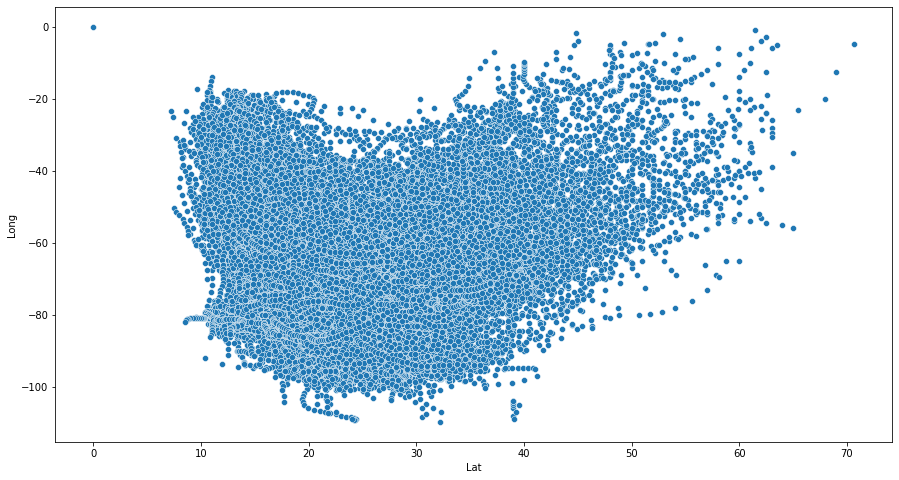

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize = (15,8))
sns.scatterplot(hurricane_list['Lat'], hurricane_list['Long'])

In [ ]:
from sklearn.cluster import KMeans ,AgglomerativeClustering

# creates 5 clusters using hierarchical clustering.
agc = AgglomerativeClustering(n_clusters =5, affinity='euclidean', linkage='ward')
hurricane_list['cluster'] = agc.fit_predict(hurricane_list[['Lat','Long']])

# creates 5 clusters using k-means clustering algorithm.
kmeans = KMeans(5)
clusters = kmeans.fit_predict(hurricane_list[['Lat','Long']])
hurricane_list['cluster'] = kmeans.predict(hurricane_list[['Lat','Long']])

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y, hue. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


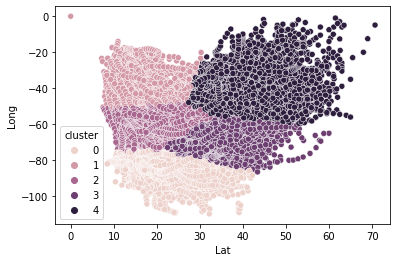

In [ ]:
sns.scatterplot(hurricane_list['Lat'], hurricane_list['Long'], hurricane_list['cluster'])


Initialize country GeoDataFrame

In [ ]:
country = geopandas.read_file('gz_2010_us_040_00_5m.json')
country.head()

,GEO_ID,STATE,NAME,LSAD,CENSUSAREA,geometry
0,0400000US01,01,Alabama,,50645.326,"MULTIPOLYGON (((-88.12466 30.28364, -88.08681 ..."
1,0400000US02,02,Alaska,,570640.950,"MULTIPOLYGON (((-166.10574 53.98861, -166.0752..."
2,0400000US04,04,Arizona,,113594.084,"POLYGON ((-112.53859 37.00067, -112.53454 37.0..."
3,0400000US05,05,Arkansas,,52035.477,"POLYGON ((-94.04296 33.01922, -94.04304 33.079..."
4,0400000US06,06,California,,155779.220,"MULTIPOLYGON (((-122.42144 37.86997, -122.4213..."


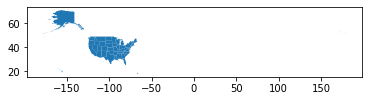

In [ ]:
country.plot()

Make a new Huricane List that is scrubbed of all Storms that are Unnamed. Storms that are called Daw were removed since the time format was off.

In [ ]:
hurricane_list_clean = hurricane_list
for row in hurricane_list_clean.itertuples():
    if row.Name == "Unnamed":
            #print(row.Index)
        hurricane_list_clean = hurricane_list_clean.drop(row.Index)
        

#Had to drop Daw because the time date for the storm is off
#time data 1972-09-00 00:00:00 doesn't match format specified
for row in hurricane_list_clean.itertuples():
    if row.Name == "Daw":
            #print(row.Index)
        hurricane_list_clean = hurricane_list_clean.drop(row.Index)
    
    #return df
hurricane_list_clean.reset_index(drop=True, inplace=True)

In [ ]:
#Dates are in datetime format
hurricane_list_clean.Date = pd.to_datetime(hurricane_list_clean.Date)


In [ ]:
# 309 unique storms in the dataset
len(hurricane_list_clean.Name.unique())

309

In [ ]:
#Create previous Long and Lat for each row
#value is zero if first row
def prevlonglat(df):
    prev_lat = float(0.0)
    prev_long = float(0.0)
    temp = pd.DataFrame()
    copy = pd.DataFrame()

    for i, row in df.iterrows():

        df.at[i,'prev Lat'] = float(prev_lat)
        df.at[i,'prev Long'] = float(prev_long)

        prev_lat = (df.at[i,'Lat']).astype(float)
        prev_long = (df.at[i,'Long']).astype(float)


    return df

In [ ]:
#Function to calculate distance between each data point
def haversine_distance(row):
    if row['prev Lat'] == 0 and row['prev Long'] == 0:
        return 0
    lat_p, lon_p = row['Lat'], row['Long']
    lat_d, lon_d = row['prev Lat'], row['prev Long']
    radius = 6371 # km

    dlat = np.radians(lat_d - lat_p)
    dlon = np.radians(lon_d - lon_p)
    a = np.sin(dlat/2) * np.sin(dlat/2) + np.cos(np.radians(lat_p)) * np.cos(np.radians(lat_d)) * np.sin(dlon/2) * np.sin(dlon/2)
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1-a))
    distance = radius * c

    return distance


In [ ]:
#plots two hurricane events
def makeChart(df1, df2, name1, name2):
    fig, ax = plt.subplots(1, figsize=(20,20))
    base = country[country['NAME'].isin(['Alaska','Hawaii']) == False].plot(ax=ax, color='#3B3C6E')
    df1.plot(ax=base, column='Wind', marker="<", markersize=10, cmap='cool', label=name1)
    _ = ax.axis('off')
    df2.plot(ax=base, column='Wind', marker="<", markersize=10, cmap='Oranges', label=name2)
    _ = ax.axis('off')
    plt.legend()
    ax.set_title("Hurricanes in US Map", fontsize=25)
    plt.savefig('Hurricane_footage.png',bbox_inches='tight');
    

In [ ]:
#plots one hurricane
def makeChartSingle(df1,name1):
    name = ("Hurricane ")
    name = name + name1
    fig, ax = plt.subplots(1, figsize=(20,20))
    base = country[country['NAME'].isin(['Alaska','Hawaii']) == False].plot(ax=ax, color='#3B3C6E')
    df1.plot(ax=base, column='Wind', marker="<", markersize=10, cmap='cool', label="Wind speed(mph)",
    scheme="Quantiles", legend=True)
    _ = ax.axis('off')
    #plt.legend()
    ax.set_title(name, fontsize=25)
    plt.savefig('Hurricane_footage.png',bbox_inches='tight');
    

In [ ]:
#Makes a GeoPandas GeoDataFrame 
#returns dataframe based on the year and name of hurricane event
def makeFrame(df,name,year):
    storm = pd.DataFrame()
    for row in df.itertuples():
        if row.Name == name and row.Date.year == year:
        
            temp = hurricane_list_clean.loc[row.Index]
            temp = pd.DataFrame([temp])
            storm = pd.concat([temp,storm])
    storm.reset_index(drop=True, inplace=True)
    storm.drop(['AdvisoryNumber', 'Forecaster', 'Received'], axis = 1)
    storm['coordinates'] = storm[['Long', 'Lat']].values.tolist()
    storm['coordinates'] = storm['coordinates'].apply(Point)
    storm.reset_index(drop=True, inplace=True)
    storm = geopandas.GeoDataFrame(storm, geometry='coordinates')
    


    return storm
    
    


In [ ]:
#prints out a list of Hurricane events in a given year
def makeYear(df,year):
    storm = pd.DataFrame()
    for row in df.itertuples():
        if row.Date.year == year:
        
            temp = hurricane_list_clean.loc[row.Index]
            temp = pd.DataFrame([temp])
            storm = pd.concat([temp,storm])
    listyear = storm.Name.unique().tolist()
    print("Storms in",year,":")
    print('\n'.join(map(str, listyear))) 
    print('\n')




In [ ]:
#To compare two storms
def start(df):
    print('1st Storm:')
    print('Enter year (1950-2018)')
    year = int(input())
    makeYear(df,year)
    name1 = input("Enter name:")
    df1 = makeFrame(df, name1, year)
    print('2nd Storm:')
    print('Enter year (1970-2020)')
    year = int(input())
    makeYear(df,year)
    name2 = input("Enter name:")  
    df2 = makeFrame(df,name2, year)
    makeChart(df1,df2,name1,name2)

In [ ]:
#To plot only one storm
def start1(df):
    print('Enter year (1950-2018)')
    year = int(input())
    makeYear(df,year)
    name = input("Enter name:")
    df1 = makeFrame(df, name, year)
    makeChartSingle(df1,name)


In [ ]:
#turns Date into Datetime format
hurricane_list_clean.Date = pd.to_datetime(hurricane_list_clean.Date)

1st Storm:
Enter year (1950-2018)
2012
Storms in 2012 :
Cyclone
Tony
Nineteen
Sandy
Eighteen
Rafael
Patty
Sixteen
Kirk
Oscar
Fifteen
Nadine
Fourteen
Michael
Thirteen
Leslie
Twelve
Eleven
Joyce
Ten
Isaac
Nine
Gordon
Eight
Helene
Seven
Florence
Six
Ernesto
Five
Debby
Chris
Beryl
Alberto


Enter name:Sandy
2nd Storm:
Enter year (1970-2020)
2017
Storms in 2017 :
Rina
Nineteen
Philippe
Eighteen
Ophelia
Seventeen
Nate
Sixteen
Maria
Fifteen
Lee
Fourteen
Katia
Thirteen
Jose
Irma
Ten
Harvey
Nine
Gert
Eight
Franklin
Seven
Emily
Six
Don
Four
Cindy
Three
Bret
Two
Ywo
Arlene
One


Enter name:Harvey


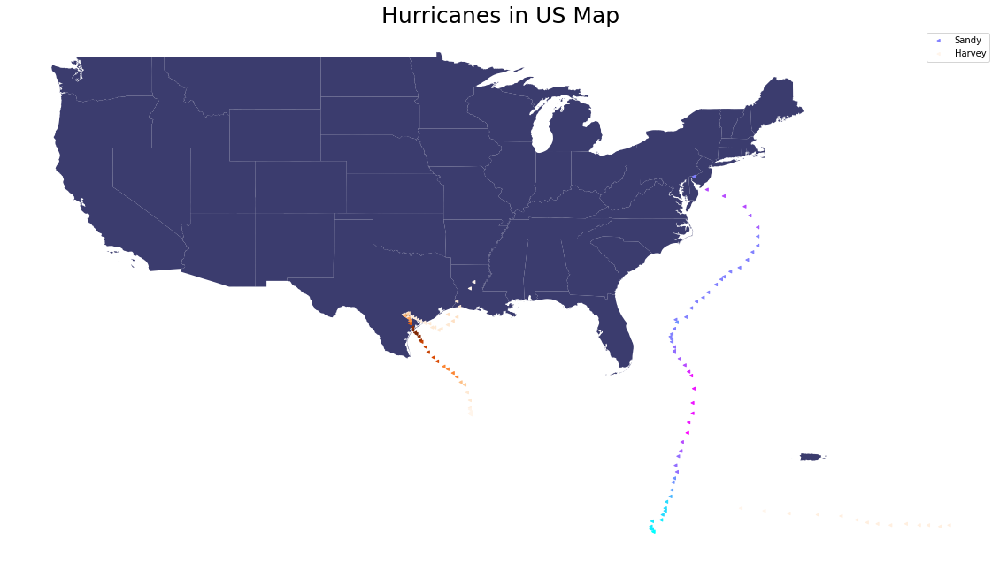

In [ ]:
#Program
#Maps two storm events that asks for user input
start(hurricane_list_clean)

Enter year (1950-2018)
1992
Storms in 1992 :
Frances
Earl
Danielle
Charley
Bonnie
Andrew


Enter name:Andrew


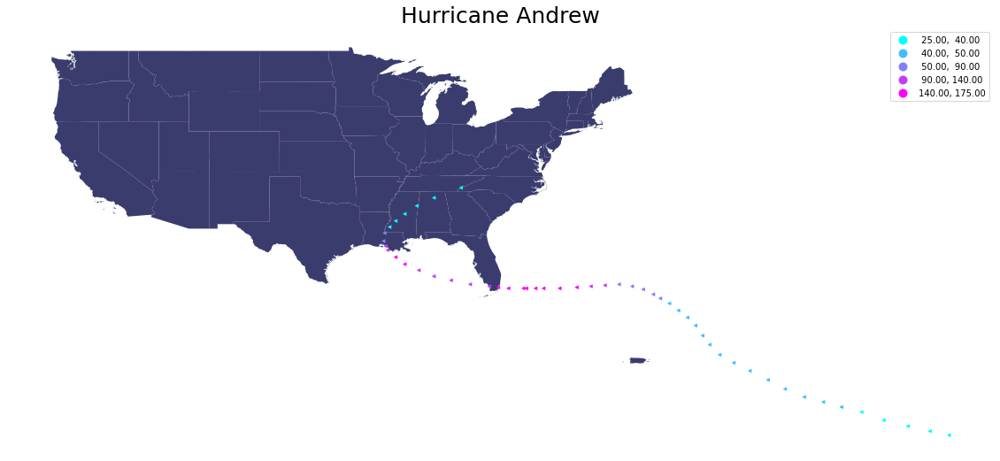

In [ ]:
#Program
#Maps one storm event that asks for user input
start1(hurricane_list_clean)

In [ ]:
#Makes a Normal Pandas Dateframe, used to calculate distance
#returns dataframe based on the year and name of hurricane event
def makeFrameDF(df,name,year):
    storm = pd.DataFrame()
    for row in df.itertuples():
        if row.Name == name and row.Date.year == year:
        
            temp = hurricane_list_clean.loc[row.Index]
            temp = pd.DataFrame([temp])
            storm = pd.concat([temp,storm])
    storm.reset_index(drop=True, inplace=True)
    storm.drop(['AdvisoryNumber', 'Forecaster', 'Received'], axis = 1)
    #storm['coordinates'] = storm[['Long', 'Lat']].values.tolist()
    #storm['coordinates'] = storm['coordinates'].apply(Point)
    storm.reset_index(drop=True, inplace=True)
    storm = pd.DataFrame(storm)
    


    return storm
    
    

In [ ]:
#Normal Pandas DataFrame for Hurricane Harvey and Katrina are generated
harvey_df = makeFrameDF(hurricane_list_clean,'Harvey',2017)
katrina_df = makeFrameDF(hurricane_list_clean,'Katrina',2005)

In [ ]:
katrina_df

,AdvisoryNumber,Date,Lat,Long,Wind,Pres,Movement,stormtypeName,Name,Received,Forecaster,cluster
0,31,2005-08-30 16:00:00,36.3,-87.5,35,985,NORTH-NORTHEAST NEAR 21 MPH,Tropical Depression,Katrina,2005-08-30 10:37:21,AVILA,0
1,30,2005-08-30 10:00:00,34.7,-88.4,50,981,NORTH-NORTHEAST NEAR 18 MPH,Tropical Storm,Katrina,2005-08-30 04:34:22,BEVEN,0
2,29,2005-08-30 04:00:00,33.5,-88.5,60,973,NORTH-NORTHEAST NEAR 22 MPH,Tropical Storm,Katrina,2005-08-29 22:34:30,FRANKLIN,0
3,28A,2005-08-30 01:00:00,32.9,-88.9,65,965,NORTH-NORTHEAST NEAR 21 MPH,Tropical Storm,Katrina,2005-08-29 19:40:30,FRANKLIN,0
4,28,2005-08-29 22:00:00,31.9,-89.6,75,960,NORTH NEAR 18 MPH,Hurricane,Katrina,2005-08-29 16:55:33,PASCH,0
5,27B,2005-08-29 20:00:00,31.4,-89.6,95,955,NORTH NEAR 18 MPH,Hurricane,Katrina,2005-08-29 15:00:51,PASCH,0
6,27A,2005-08-29 18:00:00,30.8,-89.6,105,940,NORTH NEAR 17 MPH,Hurricane,Katrina,2005-08-29 13:02:00,PASCH,0
7,27,2005-08-29 16:00:00,30.2,-89.6,125,927,NORTH NEAR 16 MPH,Hurricane,Katrina,2005-08-29 10:44:54,PASCH,0
8,26B,2005-08-29 14:00:00,29.7,-89.6,135,923,NORTH NEAR 15 MPH,Hurricane,Katrina,2005-08-29 09:00:17,PASCH,0
9,26A,2005-08-29 12:00:00,29.1,-89.6,145,918,NORTH NEAR 15 MPH,Hurricane,Katrina,2005-08-29 06:58:26,STEWART,0


In [ ]:
harvey_df

,AdvisoryNumber,Date,Lat,Long,Wind,Pres,Movement,stormtypeName,Name,Received,Forecaster,cluster
0,43,2017-08-31 04:00:00,31.7,-92.3,35,998,NNE at 9 MPH,Tropical Depression,Harvey,2017-08-30 23:35:16,Brown,0
1,42A,2017-08-31 01:00:00,31.2,-92.6,35,998,NNE at 8 MPH,Tropical Depression,Harvey,2017-08-30 19:56:53,Brown,0
2,40A,2017-08-30 13:00:00,30.2,-93.6,45,992,N at 9 MPH,Tropical Storm,Harvey,2017-08-30 07:50:35,Beven,0
3,40,2017-08-30 10:00:00,29.8,-93.4,45,990,NNE at 7 MPH,Tropical Storm,Harvey,2017-08-30 04:53:21,Berg,0
4,39,2017-08-30 04:00:00,29.0,-93.6,50,994,NE at 6 MPH,Tropical Storm,Harvey,2017-08-29 22:59:40,Brown,0
...,...,...,...,...,...,...,...,...,...,...,...,...
64,4,2017-08-18 10:00:00,13.1,-59.1,40,1004,W at 18 MPH,Tropical Storm,Harvey,2017-08-18 04:44:44,Avila,2
65,3A,2017-08-18 07:00:00,13.0,-58.1,40,1005,W at 17 MPH,Tropical Storm,Harvey,2017-08-18 01:41:44,Avila,2
66,3,2017-08-18 04:00:00,13.0,-57.4,40,1005,W at 18 MPH,Tropical Storm,Harvey,2017-08-17 22:32:40,Pasch,2
67,2A,2017-08-18 01:00:00,12.9,-56.5,40,1005,W at 18 MPH,Tropical Storm,Harvey,2017-08-17 19:53:54,Pasch,2


In [ ]:
#Get the distance for Hurricane Katrina
katrina_df = prevlonglat(katrina_df)
katrina_df['distance'] = katrina_df.apply(haversine_distance, axis = 1)
katrina_df

,AdvisoryNumber,Date,Lat,Long,Wind,Pres,Movement,stormtypeName,Name,Received,Forecaster,cluster,prev Lat,prev Long,distance
0,31,2005-08-30 16:00:00,36.3,-87.5,35,985,NORTH-NORTHEAST NEAR 21 MPH,Tropical Depression,Katrina,2005-08-30 10:37:21,AVILA,0,0.0,0.0,0.000000
1,30,2005-08-30 10:00:00,34.7,-88.4,50,981,NORTH-NORTHEAST NEAR 18 MPH,Tropical Storm,Katrina,2005-08-30 04:34:22,BEVEN,0,36.3,-87.5,195.676636
2,29,2005-08-30 04:00:00,33.5,-88.5,60,973,NORTH-NORTHEAST NEAR 22 MPH,Tropical Storm,Katrina,2005-08-29 22:34:30,FRANKLIN,0,34.7,-88.4,133.751193
3,28A,2005-08-30 01:00:00,32.9,-88.9,65,965,NORTH-NORTHEAST NEAR 21 MPH,Tropical Storm,Katrina,2005-08-29 19:40:30,FRANKLIN,0,33.5,-88.5,76.395483
4,28,2005-08-29 22:00:00,31.9,-89.6,75,960,NORTH NEAR 18 MPH,Hurricane,Katrina,2005-08-29 16:55:33,PASCH,0,32.9,-88.9,129.163095
5,27B,2005-08-29 20:00:00,31.4,-89.6,95,955,NORTH NEAR 18 MPH,Hurricane,Katrina,2005-08-29 15:00:51,PASCH,0,31.9,-89.6,55.597463
6,27A,2005-08-29 18:00:00,30.8,-89.6,105,940,NORTH NEAR 17 MPH,Hurricane,Katrina,2005-08-29 13:02:00,PASCH,0,31.4,-89.6,66.716956
7,27,2005-08-29 16:00:00,30.2,-89.6,125,927,NORTH NEAR 16 MPH,Hurricane,Katrina,2005-08-29 10:44:54,PASCH,0,30.8,-89.6,66.716956
8,26B,2005-08-29 14:00:00,29.7,-89.6,135,923,NORTH NEAR 15 MPH,Hurricane,Katrina,2005-08-29 09:00:17,PASCH,0,30.2,-89.6,55.597463
9,26A,2005-08-29 12:00:00,29.1,-89.6,145,918,NORTH NEAR 15 MPH,Hurricane,Katrina,2005-08-29 06:58:26,STEWART,0,29.7,-89.6,66.716956


In [ ]:
#GeoDataFrame for Hurricane Harvey and Katrina are generated
harvey = makeFrame(hurricane_list_clean,'Harvey',2017)
katrina = makeFrame(hurricane_list_clean,'Katrina',2005)

In [ ]:
katrina

,AdvisoryNumber,Date,Lat,Long,Wind,Pres,Movement,stormtypeName,Name,Received,Forecaster,cluster,coordinates
0,31,2005-08-30 16:00:00,36.3,-87.5,35,985,NORTH-NORTHEAST NEAR 21 MPH,Tropical Depression,Katrina,2005-08-30 10:37:21,AVILA,0,POINT (-87.50000 36.30000)
1,30,2005-08-30 10:00:00,34.7,-88.4,50,981,NORTH-NORTHEAST NEAR 18 MPH,Tropical Storm,Katrina,2005-08-30 04:34:22,BEVEN,0,POINT (-88.40000 34.70000)
2,29,2005-08-30 04:00:00,33.5,-88.5,60,973,NORTH-NORTHEAST NEAR 22 MPH,Tropical Storm,Katrina,2005-08-29 22:34:30,FRANKLIN,0,POINT (-88.50000 33.50000)
3,28A,2005-08-30 01:00:00,32.9,-88.9,65,965,NORTH-NORTHEAST NEAR 21 MPH,Tropical Storm,Katrina,2005-08-29 19:40:30,FRANKLIN,0,POINT (-88.90000 32.90000)
4,28,2005-08-29 22:00:00,31.9,-89.6,75,960,NORTH NEAR 18 MPH,Hurricane,Katrina,2005-08-29 16:55:33,PASCH,0,POINT (-89.60000 31.90000)
5,27B,2005-08-29 20:00:00,31.4,-89.6,95,955,NORTH NEAR 18 MPH,Hurricane,Katrina,2005-08-29 15:00:51,PASCH,0,POINT (-89.60000 31.40000)
6,27A,2005-08-29 18:00:00,30.8,-89.6,105,940,NORTH NEAR 17 MPH,Hurricane,Katrina,2005-08-29 13:02:00,PASCH,0,POINT (-89.60000 30.80000)
7,27,2005-08-29 16:00:00,30.2,-89.6,125,927,NORTH NEAR 16 MPH,Hurricane,Katrina,2005-08-29 10:44:54,PASCH,0,POINT (-89.60000 30.20000)
8,26B,2005-08-29 14:00:00,29.7,-89.6,135,923,NORTH NEAR 15 MPH,Hurricane,Katrina,2005-08-29 09:00:17,PASCH,0,POINT (-89.60000 29.70000)
9,26A,2005-08-29 12:00:00,29.1,-89.6,145,918,NORTH NEAR 15 MPH,Hurricane,Katrina,2005-08-29 06:58:26,STEWART,0,POINT (-89.60000 29.10000)


In [ ]:
harvey

,AdvisoryNumber,Date,Lat,Long,Wind,Pres,Movement,stormtypeName,Name,Received,Forecaster,cluster,coordinates
0,43,2017-08-31 04:00:00,31.7,-92.3,35,998,NNE at 9 MPH,Tropical Depression,Harvey,2017-08-30 23:35:16,Brown,0,POINT (-92.30000 31.70000)
1,42A,2017-08-31 01:00:00,31.2,-92.6,35,998,NNE at 8 MPH,Tropical Depression,Harvey,2017-08-30 19:56:53,Brown,0,POINT (-92.60000 31.20000)
2,40A,2017-08-30 13:00:00,30.2,-93.6,45,992,N at 9 MPH,Tropical Storm,Harvey,2017-08-30 07:50:35,Beven,0,POINT (-93.60000 30.20000)
3,40,2017-08-30 10:00:00,29.8,-93.4,45,990,NNE at 7 MPH,Tropical Storm,Harvey,2017-08-30 04:53:21,Berg,0,POINT (-93.40000 29.80000)
4,39,2017-08-30 04:00:00,29.0,-93.6,50,994,NE at 6 MPH,Tropical Storm,Harvey,2017-08-29 22:59:40,Brown,0,POINT (-93.60000 29.00000)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
64,4,2017-08-18 10:00:00,13.1,-59.1,40,1004,W at 18 MPH,Tropical Storm,Harvey,2017-08-18 04:44:44,Avila,2,POINT (-59.10000 13.10000)
65,3A,2017-08-18 07:00:00,13.0,-58.1,40,1005,W at 17 MPH,Tropical Storm,Harvey,2017-08-18 01:41:44,Avila,2,POINT (-58.10000 13.00000)
66,3,2017-08-18 04:00:00,13.0,-57.4,40,1005,W at 18 MPH,Tropical Storm,Harvey,2017-08-17 22:32:40,Pasch,2,POINT (-57.40000 13.00000)
67,2A,2017-08-18 01:00:00,12.9,-56.5,40,1005,W at 18 MPH,Tropical Storm,Harvey,2017-08-17 19:53:54,Pasch,2,POINT (-56.50000 12.90000)


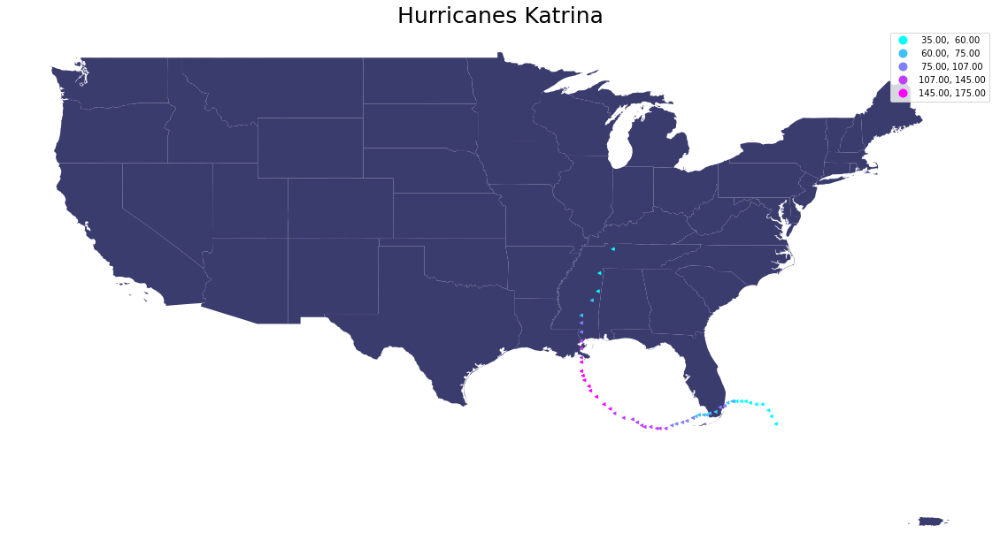

In [ ]:
#plot of Hurricane Katrina
fig, ax = plt.subplots(1, figsize=(20,20))
base = country[country['NAME'].isin(['Alaska','Hawaii']) == False].plot(ax=ax, color='#3B3C6E')
katrina.plot(ax=base, column='Wind', marker="<", markersize=10, cmap='cool', label="Wind speed(mph)",
        scheme="Quantiles", legend=True)
_ = ax.axis('off')
#plt.legend()
ax.set_title("Hurricane Katrina", fontsize=25)
plt.savefig('Hurricane_footage.png',bbox_inches='tight');

# Machine Learning 1st try

Training Data

https://www.freecodecamp.org/news/the-ultimate-guide-to-recurrent-neural-networks-in-python/

In [ ]:
training_data = pd.read_csv('hurricane_list_train.csv')
training_data = prevlonglat(training_data)
training_data['Distance'] = training_data.apply(haversine_distance, axis =1)
training_data

,AdvisoryNumber,Date,Lat,Long,Wind,Pres,Movement,stormtypeName,Name,Received,Forecaster,prev Lat,prev Long,Distance
0,1,6/12/02 12:00,17.7,-84.0,35,0,0 at 0mph,Tropical Depression,Unnamed,6/12/02 12:00,Unknown,0.0,0.0,0.000000
1,2,6/12/02 18:00,19.1,-83.6,35,0,15 at 16mph,Tropical Depression,Unnamed,6/12/02 18:00,Unknown,17.7,-84.0,161.292022
2,3,6/13/02 0:00,20.7,-83.3,40,0,10 at 18mph,Tropical Storm,Unnamed,6/13/02 0:00,Unknown,19.1,-83.6,180.655504
3,4,6/13/02 6:00,22.2,-83.1,45,0,5 at 17mph,Tropical Storm,Unnamed,6/13/02 6:00,Unknown,20.7,-83.3,168.071709
4,5,6/13/02 12:00,23.8,-83.0,50,0,5 at 18mph,Tropical Storm,Unnamed,6/13/02 12:00,Unknown,22.2,-83.1,178.206043
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27193,7,10/8/59 6:00,29.3,-87.9,50,0,15 at 10mph,Tropical Storm,Irene,10/8/59 6:00,Unknown,28.4,-88.2,104.253360
27194,8,10/8/59 12:00,30.2,-87.6,60,1000,15 at 10mph,Tropical Storm,Irene,10/8/59 12:00,Unknown,29.3,-87.9,104.181780
27195,9,10/8/59 18:00,31.1,-87.0,35,0,30 at 11mph,Tropical Depression,Irene,10/8/59 18:00,Unknown,30.2,-87.6,115.365921
27196,10,10/9/59 0:00,32.3,-86.1,30,0,35 at 16mph,Tropical Depression,Irene,10/9/59 0:00,Unknown,31.1,-87.0,158.283669


In [ ]:
training_data = hurricane_list_clean.iloc[:, 1].values


In [ ]:
training_data

array(['1950-08-12T00:00:00.000000000', '1950-08-12T06:00:00.000000000',
       '1950-08-12T12:00:00.000000000', ...,
       '2006-01-06T10:00:00.000000000', '2006-01-06T16:00:00.000000000',
       '2006-01-06T22:00:00.000000000'], dtype='datetime64[ns]')

In [ ]:
np.ndarray


numpy.ndarray

In [ ]:
from sklearn.preprocessing import MinMaxScaler


In [ ]:
scaler = MinMaxScaler()


In [ ]:
training_data = scaler.fit_transform(training_data.reshape(-1, 1))


In [ ]:

x_training_data = []

y_training_data =[]

In [ ]:
for i in range(40, len(training_data)):

    x_training_data.append(training_data[i-40:i, 0])

    y_training_data.append(training_data[i, 0])

In [ ]:
x_training_data = np.array(x_training_data)

y_training_data = np.array(y_training_data)

In [ ]:

print(x_training_data.shape)

print(y_training_data.shape)

(23509, 40)
(23509,)


In [ ]:
x_training_data = np.reshape(x_training_data, (x_training_data.shape[0], 

                                               x_training_data.shape[1], 

                                               1))

In [ ]:
print(x_training_data.shape)

(23509, 40, 1)


In [ ]:
from tensorflow.keras.models import Sequential

from tensorflow.keras.layers import Dense

from tensorflow.keras.layers import LSTM

from tensorflow.keras.layers import Dropout


In [ ]:
rnn = Sequential()

In [ ]:
rnn.add(LSTM(units = 45, return_sequences = True, input_shape = (x_training_data.shape[1], 1)))


In [ ]:
rnn.add(Dropout(0.2))


In [ ]:

rnn.add(LSTM(units = 45, return_sequences = True))

rnn.add(Dropout(0.2))

rnn.add(LSTM(units = 45, return_sequences = True))

rnn.add(Dropout(0.2))

rnn.add(LSTM(units = 45))

rnn.add(Dropout(0.2))


In [ ]:
for i in [True, True, False]:

    rnn.add(Dropout(0.2))

In [ ]:
rnn.add(Dense(units = 1))

In [ ]:
rnn.compile(optimizer = 'adam', loss = 'mean_squared_error')

In [ ]:
rnn.fit(x_training_data, y_training_data, epochs = 15, batch_size = 32)


Epoch 1/15
735/735 [==============================] - 53s 73ms/step - loss: 0.0143
Epoch 2/15
735/735 [==============================] - 52s 70ms/step - loss: 0.0080
Epoch 3/15
735/735 [==============================] - 52s 71ms/step - loss: 0.0057
Epoch 4/15
735/735 [==============================] - 53s 72ms/step - loss: 0.0049
Epoch 5/15
735/735 [==============================] - 52s 71ms/step - loss: 0.0046
Epoch 6/15
735/735 [==============================] - 52s 71ms/step - loss: 0.0044
Epoch 7/15
735/735 [==============================] - 52s 71ms/step - loss: 0.0043
Epoch 8/15
735/735 [==============================] - 51s 69ms/step - loss: 0.0042
Epoch 9/15
735/735 [==============================] - 52s 71ms/step - loss: 0.0042
Epoch 10/15
735/735 [==============================] - 54s 73ms/step - loss: 0.0041
Epoch 11/15
735/735 [==============================] - 55s 75ms/step - loss: 0.0041
Epoch 12/15
735/735 [==============================] - 54s 74ms/step - loss: 0.0040
E

Test Data

In [ ]:
test_data = pd.read_csv('hurricane_list_test.csv')

test_data = test_data.iloc[:, 1].values


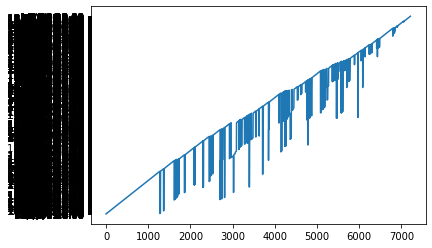

In [ ]:
plt.plot(test_data)

In [ ]:
unscaled_x_training_data = pd.read_csv('hurricane_list_train.csv')

unscaled_test_data = pd.read_csv('hurricane_list_test.csv')

In [ ]:
unscaled_x_training_data

,AdvisoryNumber,Date,Lat,Long,Wind,Pres,Movement,stormtypeName,Name,Received,Forecaster
0,1,6/12/02 12:00,17.7,-84.0,35,0,0 at 0mph,Tropical Depression,Unnamed,6/12/02 12:00,Unknown
1,2,6/12/02 18:00,19.1,-83.6,35,0,15 at 16mph,Tropical Depression,Unnamed,6/12/02 18:00,Unknown
2,3,6/13/02 0:00,20.7,-83.3,40,0,10 at 18mph,Tropical Storm,Unnamed,6/13/02 0:00,Unknown
3,4,6/13/02 6:00,22.2,-83.1,45,0,5 at 17mph,Tropical Storm,Unnamed,6/13/02 6:00,Unknown
4,5,6/13/02 12:00,23.8,-83.0,50,0,5 at 18mph,Tropical Storm,Unnamed,6/13/02 12:00,Unknown
...,...,...,...,...,...,...,...,...,...,...,...
27193,7,10/8/59 6:00,29.3,-87.9,50,0,15 at 10mph,Tropical Storm,Irene,10/8/59 6:00,Unknown
27194,8,10/8/59 12:00,30.2,-87.6,60,1000,15 at 10mph,Tropical Storm,Irene,10/8/59 12:00,Unknown
27195,9,10/8/59 18:00,31.1,-87.0,35,0,30 at 11mph,Tropical Depression,Irene,10/8/59 18:00,Unknown
27196,10,10/9/59 0:00,32.3,-86.1,30,0,35 at 16mph,Tropical Depression,Irene,10/9/59 0:00,Unknown


In [ ]:
all_data = pd.concat((unscaled_x_training_data['Wind'], unscaled_test_data['Wind']), axis = 0)
all_data

0       35
1       35
2       40
3       45
4       50
        ..
7212    40
7213    40
7214    40
7215    35
7216    30
Name: Wind, Length: 34415, dtype: int64

In [ ]:
unscaled_x_training_data['Wind']

0        35
1        35
2        40
3        45
4        50
         ..
27193    50
27194    60
27195    35
27196    30
27197    30
Name: Wind, Length: 27198, dtype: int64

In [ ]:
x_test_data = all_data[len(all_data) - len(test_data) - 40:].values


In [ ]:
x_test_data

array([50, 60, 65, ..., 40, 35, 30])

In [ ]:
x_test_data = np.reshape(x_test_data, (-1, 1))


https://stackoverflow.com/questions/51150153/valueerror-expected-2d-array-got-1d-array-instead

In [ ]:
#x_test_data = x_test_data.reshape(-1,1)
x_test_data = scaler.transform(x_test_data)


In [ ]:
final_x_test_data = []

for i in range(40, len(x_test_data)):

  final_x_test_data.append(x_test_data[i-40:i, 0])

final_x_test_data = np.array(final_x_test_data)

In [ ]:
final_x_test_data = np.reshape(final_x_test_data, (final_x_test_data.shape[0], 

                                               final_x_test_data.shape[1], 

                                               1))

Predictions

In [ ]:
predictions = rnn.predict(final_x_test_data)


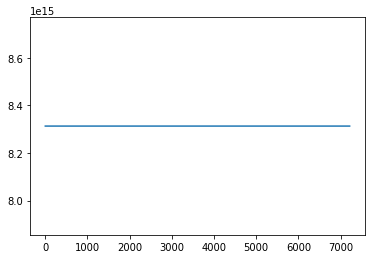

In [ ]:
unscaled_predictions = scaler.inverse_transform(predictions)

plt.clf() #This clears the first prediction plot from our canvas

plt.plot(unscaled_predictions)


Text(0.5, 1.0, 'Hurricane Predictions')

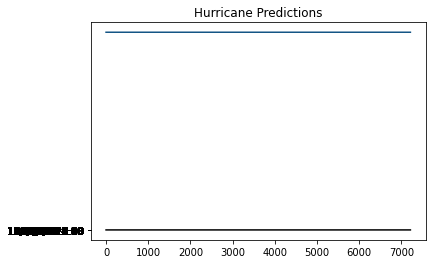

In [ ]:
plt.plot(unscaled_predictions, color = '#135485', label = "Predictions")

plt.plot(test_data, color = 'black', label = "Real Data")

plt.title('Hurricane Predictions')

https://github.com/ResidentMario/hurdat2/blob/master/data/atlantic_storms.csv

https://medium.com/@kap923/hurricane-path-prediction-using-deep-learning-2f9fbb390f18

https://towardsdatascience.com/hurricane-florence-building-a-simple-storm-track-prediction-model-1e1c404eb045

# Second Method (Grids)


https://github.com/sheilaalemany/hurricane-rnn


The second attempt at deploying a neural network revolved around implementing a grid based system for the model to train on.

A different Hurricane dataset was used. For this approach the Hurricane Database dataset from Unisys Weather is used for this implementation. For traning purposes the hurricane data ranges from 2000-2009.

### Get and Analyze the Data



Basemap had some issues installing, so these commands are done so that it properly works


In [ ]:
!apt-get -qq install libgeos-dev
!pip install -qq https://github.com/matplotlib/basemap/archive/master.zip
from mpl_toolkits.basemap import Basemap, cm

In [ ]:
#imports needed for this section
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import matplotlib.pyplot as plt

import pandas as pd
import numpy as np

from geopy.distance import great_circle as vc
import math as Math

from mpl_toolkits.basemap import Basemap
import matplotlib.cm as cm

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from keras.models import Sequential
from keras.layers.core import Dense, Dropout, Activation
from keras.layers.recurrent import LSTM
import math, time

from keras.models import model_from_json

In [ ]:
data = pd.read_csv('1920-2012-data.csv', index_col=None, names=['Year', 'Month', 'Day', 'Hour', 'HurricaneNum', 'Name', 'Lat', 'Long', 'WindSpeed', 'Pressure', 'NullCol'])

# Create a unique key for all of the hurricane
data['unique-key'] = data['Name'] + '-' + data['Year'].map(str) + '-' + data['HurricaneNum'].map(str)

# Delete the columns of information that we are not using so far
data.drop(['Name', 'HurricaneNum', 'Year', 'NullCol'], axis = 1, inplace = True)

# Preview the first 5 rows of data
data.head()

,Month,Day,Hour,Lat,Long,WindSpeed,Pressure,unique-key
0,6,7,18,21,-93.0,25.0,0,NOTNAMED-2000-1
1,6,8,0,20.9,-92.8,25.0,0,NOTNAMED-2000-1
2,6,8,6,20.7,-93.1,25.0,0,NOTNAMED-2000-1
3,6,8,12,20.8,-93.5,25.0,0,NOTNAMED-2000-1
4,6,23,0,9.5,-19.8,25.0,0,NOTNAMED-2000-2


In [ ]:
# Remove hurricanes where pressure = 0
data = data[data['Pressure'] != 0]
data.head()

,Month,Day,Hour,Lat,Long,WindSpeed,Pressure,unique-key
16,8,3,18,10.8,-18.0,25.0,1007,ALBERTO-2000-3
17,8,4,0,11.5,-20.1,30.0,1005,ALBERTO-2000-3
18,8,4,6,12,-22.3,35.0,1004,ALBERTO-2000-3
19,8,4,12,12.3,-23.8,35.0,1003,ALBERTO-2000-3
20,8,4,18,12.7,-25.2,40.0,1002,ALBERTO-2000-3


In [ ]:
# Total amount of hurricanes we have in our dataset 
total_hurricane_count = len(pd.unique(data['unique-key']))
print(total_hurricane_count)

790


In [ ]:
# Finding errors in CSV
print(data[data['Lat'].str.contains("NAMED")])

data = data[~data['Lat'].str.contains("NAMED")]

      Month  Day  Hour    Lat  Long  WindSpeed  Pressure   unique-key
5997      8   31    12  NAMED  37.1      -64.3        25  NOT-2011-20
5998      8   31    18  NAMED  37.1      -64.1        25  NOT-2011-20
5999      9    1     0  NAMED  37.3      -63.9        25  NOT-2011-20
6000      9    1     6  NAMED  37.4      -63.7        30  NOT-2011-20
6001      9    1    12  NAMED  37.4      -63.7        40  NOT-2011-20
6002      9    1    18  NAMED  37.4      -63.8        35  NOT-2011-20
6003      9    2     0  NAMED  37.5      -63.8        35  NOT-2011-20
6004      9    2     6  NAMED  37.8      -63.7        40  NOT-2011-20
6005      9    2    12  NAMED  38.0      -62.8        40  NOT-2011-20
6006      9    2    18  NAMED  39.0      -61.8        35  NOT-2011-20
6007      9    3     0  NAMED  40.0      -60.7        30  NOT-2011-20
6008      9    3     6  NAMED  41.0      -59.9        30  NOT-2011-20
6009      9    3    12  NAMED  42.0      -59.2        30  NOT-2011-20
6010      9    3    

In [ ]:
# Total amount of hurricanes we have in our dataset 
total_hurricane_count = len(pd.unique(data['unique-key']))
print(total_hurricane_count)

789


In [ ]:
# Since our keys are strings, we enumerate them to access them as integers 
keys = list(enumerate(pd.unique(data['unique-key'])))

total_hurricane_count = len(pd.unique(data['unique-key']))
print(total_hurricane_count)

y = np.zeros((total_hurricane_count))
for x in range(0,total_hurricane_count):
    y[x] = len(pd.DataFrame(data[data['unique-key'] == keys[x][1]], columns = data.keys()).reset_index(drop = True))
    
# Now contains how many time instances of data (or rows) each hurricane contains 
hurricane_amount = pd.DataFrame(y)

789


In [ ]:
# Print the hurricane key with the amount of data they contain
print ('Top 6 Hurricanes (in terms of data quantity)')
for x in hurricane_amount.nlargest(6, 0).index:
    print (keys[x][1], "-", hurricane_amount.loc[x][0])
    
# Provides statistical information about the DataFrame 
# From here we can see that the shortest hurricane only has 4 rows of information and the largest hurricane has 94 rows
hurricane_amount.describe()

Top 6 Hurricanes (in terms of data quantity)
NADINE-2012-14 - 96.0
IVAN-2004-9 - 94.0
KYLE-2002-12 - 90.0
ALBERTO-2000-3 - 87.0
ARLENE-1987-2 - 81.0
NICHOLAS-2003-19 - 80.0


,0
count,789.000000
mean,20.778200
std,18.740283
min,1.000000
25%,6.000000
50%,15.000000
75%,31.000000
max,96.000000


In [ ]:
cond = (hurricane_amount > 6) & (hurricane_amount < 60)
keys25 = []

for x in cond.index:
    if cond.loc[x][0]:
        keys25.append(keys[x][1])

word2keys = {}
for x in keys:
    word2keys[x[1]] = x[0]
    
data = data[data['unique-key'].isin(keys25)]
keys = list(enumerate(pd.unique(data['unique-key'])))
data.head()

,Month,Day,Hour,Lat,Long,WindSpeed,Pressure,unique-key
116,8,13,18,22.5,-93.5,30.0,1008,BERYL-2000-5
117,8,14,0,22.7,-93.8,30.0,1008,BERYL-2000-5
118,8,14,6,23.1,-94.6,35.0,1007,BERYL-2000-5
119,8,14,12,23.5,-95.4,40.0,1009,BERYL-2000-5
120,8,14,18,23.9,-96.3,45.0,1009,BERYL-2000-5


In [ ]:
# Print the hurricane key with the amount of data they contain
print ('Top 6 Hurricanes (in terms of data quantity)')
for x in hurricane_amount.nlargest(6, 0).index:
    print (keys[x][1], "-", hurricane_amount.loc[x][0])

Top 6 Hurricanes (in terms of data quantity)
FABIAN-1991-9 - 96.0
EMILY-2005-5 - 94.0
DANNY-2003-5 - 90.0
BERYL-2000-5 - 87.0
IRENE-1971-18 - 81.0
HERMINE-2004-8 - 80.0


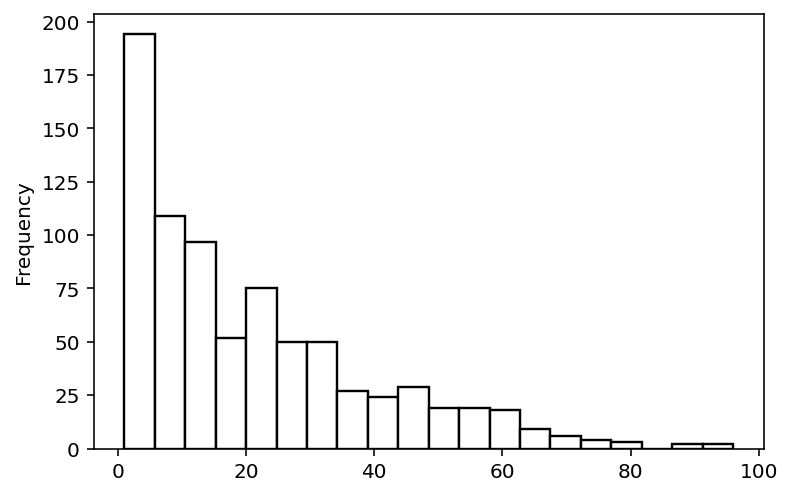

In [ ]:
# Print the distribution of data quantity for all hurricanes
dist = hurricane_amount.plot.hist(bins=20, edgecolor='black', histtype='barstacked', color='white', legend=None, linewidth=1.2)
plt.show()

In [ ]:
data.describe()

,Month,Day,Hour,Long,WindSpeed,Pressure
count,13131.000000,13131.000000,13131.000000,13131.000000,13131.000000,13131.000000
mean,8.724621,15.828269,9.186810,-64.398149,50.883939,993.863834
std,1.375840,8.906905,6.729553,20.182565,25.903755,18.023786
min,1.000000,1.000000,0.000000,-109.300000,10.000000,882.000000
25%,8.000000,8.000000,6.000000,-80.700000,30.000000,987.000000
50%,9.000000,16.000000,12.000000,-65.800000,45.000000,1000.000000
75%,10.000000,24.000000,18.000000,-49.500000,65.000000,1007.000000
max,12.000000,31.000000,23.000000,13.500000,165.000000,1024.000000


In [ ]:
# Since our keys are strings, we enumerate them to access them as integers 
keys = list(enumerate(pd.unique(data['unique-key'])))

total_hurricane_count = len(pd.unique(data['unique-key']))
print(total_hurricane_count)

y = np.zeros((total_hurricane_count))
for x in range(0,total_hurricane_count):
    y[x] = len(pd.DataFrame(data[data['unique-key'] == keys[x][1]], columns = data.keys()).reset_index(drop = True))
    
# Now contains how many time instances of data (or rows) each hurricane contains 
hurricane_amount = pd.DataFrame(y)

539


In [ ]:
# Total amount of data tuples
total_data_count = len(data)
print(total_data_count)

13131


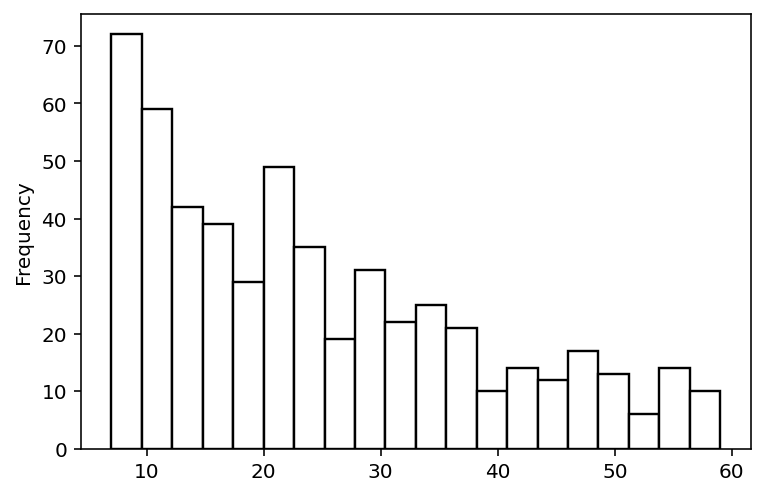

In [ ]:
# Print the distribution of data quantity for all hurricanes
dist = hurricane_amount.plot.hist(bins=20, edgecolor='black', histtype='barstacked', color='white', legend=None, linewidth=1.2)
# plt.savefig('frequency_graph', dpi=600)
plt.show()

In [ ]:
data.to_csv('checkpoint-dataframe.csv') # Save the dataframe to csv for checkpoint

### Data Preprocessing

From the dataset, we have latitude and longitude. It is easier for the neural network to learn from distance vectors since these values do not contain negative values (like latitude and longitude). To preprocess our data, we will calculate the angle of travel and distance between each given point and add that as new columns to our DataFrame. In addition, we will remove the outlier hurricanes, to get a more normal distribution to insert into the neural network.

In [ ]:
data = pd.read_csv('checkpoint-dataframe.csv', index_col=0, header=0)

In [ ]:
y = np.zeros(total_hurricane_count)
data['distance'] = np.zeros(total_data_count)
data['direction'] = np.zeros(total_data_count)

# For all hurricanes
for x in range(0, total_hurricane_count):
    t = pd.DataFrame(data[data['unique-key'] == keys[x][1]], columns = data.keys()).reset_index(drop = False)
    dst = 0
    prev = (0,0)
    
    # For all latitude and longitude points of hurricane, calculate the angle of travel and distance
    for p in zip(t['Lat'], t['Long']):
        
        if prev == (0,0):
            prev = p
            continue 
        # Stores the distance into the DataFrame
        #data.set_value(t[(t['Lat'] == p[0]) & (t['Long'] == p[1])]['index'].values[0], 'distance', vc(prev,p).miles)
        data.at[t[(t['Lat'] == p[0]) & (t['Long'] == p[1])]['index'].values[0],'distance'] = vc(prev,p).miles
        dLon = p[1] - prev[1];  
        temp = float(p[0]) # p[0] is a str?
        y_x = Math.sin(dLon) * Math.cos(temp);
        
        x_x = Math.cos(p[1]) * Math.sin(temp) - Math.sin(p[1]) * Math.cos(temp) * Math.cos(dLon);
        brng = Math.degrees(Math.atan2(y_x, x_x)) 
        if (brng < 0):
            brng+= 360;
        
        # Stores the angle of travel into the DataFrame
        #data.set_value(t[(t['Lat'] == p[0]) & (t['Long'] == p[1])]['index'].values[0], 'direction', brng)
        data.at[t[(t['Lat'] == p[0]) & (t['Long'] == p[1])]['index'].values[0],'direction'] = brng

        dst += vc(prev,p).miles
        prev = p
    y[x] = dst

# Now contains the distance between all given latitude and longitude points
hurricane_distance = pd.DataFrame(y)

In [ ]:
# Columns have been added
data.head()

,Month,Day,Hour,Lat,Long,WindSpeed,Pressure,unique-key,distance,direction
116,8,13,18,22.5,-93.5,30.0,1008,BERYL-2000-5,0.000000,0.000000
117,8,14,0,22.7,-93.8,30.0,1008,BERYL-2000-5,23.604117,140.567975
118,8,14,6,23.1,-94.6,35.0,1007,BERYL-2000-5,57.935076,161.351184
119,8,14,12,23.5,-95.4,40.0,1009,BERYL-2000-5,57.802056,174.302218
120,8,14,18,23.9,-96.3,45.0,1009,BERYL-2000-5,63.292296,337.250833


In [ ]:
print(hurricane_distance.shape)

(539, 1)


In [ ]:
# Here we can see that the hurricane that traveled the least only traveled 65 miles, while the one that traveled the most traveled 8402 miles
hurricane_distance.describe()

,0
count,539.000000
mean,2171.303649
std,1361.057169
min,86.434363
25%,1086.740042
50%,1871.643323
75%,2951.363435
max,6392.865052


In [ ]:
# Print the hurricane key with the amount of data they contain
print ('Top 6 Hurricanes (in terms of distance traveled)')
for x in hurricane_distance.nlargest(6, 0).index:
    print (keys[x][1], "-", hurricane_distance.loc[x][0], "miles -", hurricane_amount.loc[x][0])
    
# print(len(hurricane_distance[0]))
# print(len(hurricane_amount[0]))

Top 6 Hurricanes (in terms of distance traveled)
KATE-2003-16 - 6392.865052499503 miles - 58.0
BERTHA-1996-2 - 6391.7852319952735 miles - 51.0
RAFAEL-2012-17 - 6351.748249370006 miles - 56.0
BILL-2009-3 - 6236.426920398357 miles - 46.0
EARL-2010-7 - 6197.2768847902635 miles - 55.0
ISAAC-2000-13 - 6156.937260531036 miles - 52.0


[[1.        0.7385791]
 [0.7385791 1.       ]]


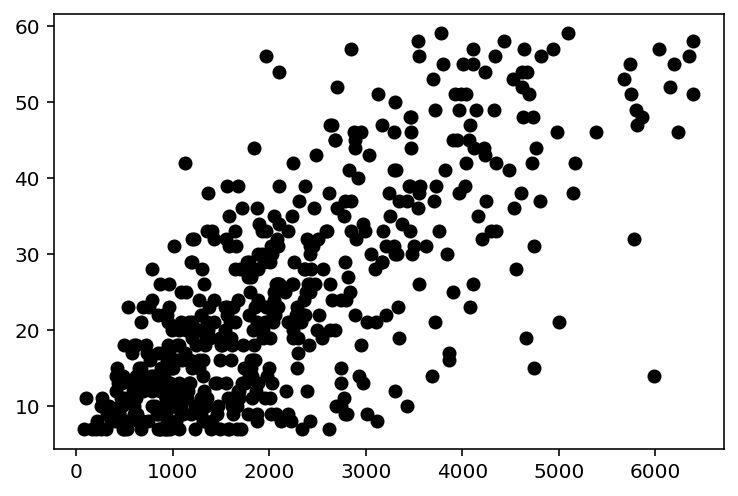

In [ ]:
print( np.corrcoef(hurricane_distance[0], hurricane_amount[0]) )
# Plotted the amount of hurricane distance traveled vs the amount of data they contain.
corr = plt.scatter(hurricane_distance[0], hurricane_amount[0], color='black')
# plt.savefig('points_vs_distance', dpi=600)
plt.show()

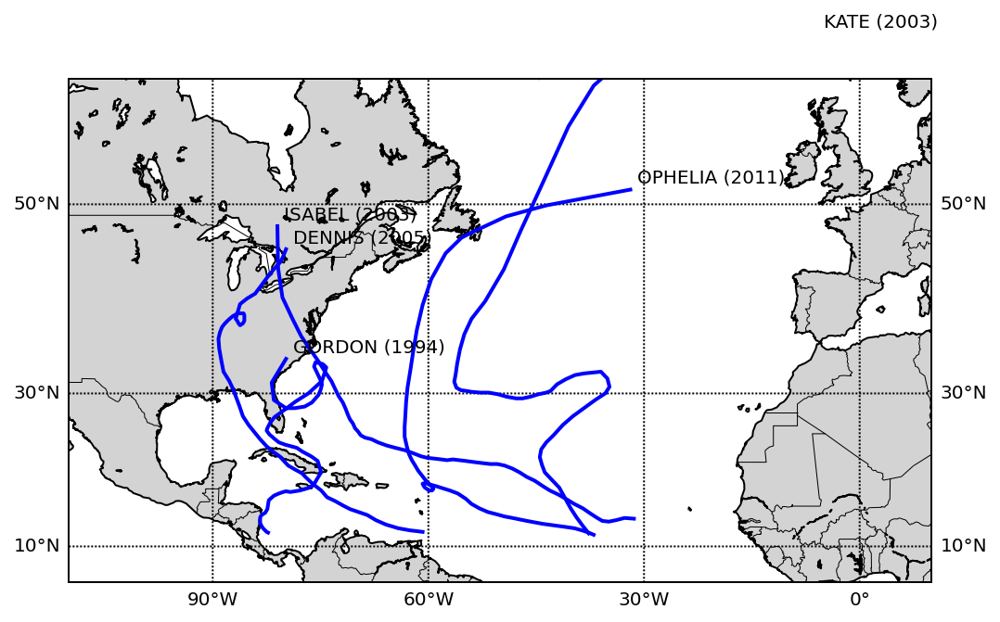

In [ ]:
n = 5 # Number of hurricanes

# Graph the trajectories of the longest hurricanes (the ones that traveled the most)
plt.figure(figsize=(10,5))
m = Basemap(llcrnrlon=-110.,llcrnrlat=5.,urcrnrlon=10.,urcrnrlat=60.,
            rsphere=(6378137.00,6356752.3142),
            resolution='l',
            projection='merc',
            lat_0=40.,lon_0=-20.,lat_ts=20.)
m.drawcoastlines()
m.drawcountries()
m.drawmapboundary(fill_color='white')
m.fillcontinents(color='#D3D3D3')
m.drawparallels(np.arange(10,90,20),labels=[1,1,0,1])
m.drawmeridians(np.arange(-180,180,30),labels=[1,1,0,1])

for x in hurricane_amount.nlargest(n,0).index:
    largest_hurr = data[data['unique-key'] == keys[x][1]]
    lat = largest_hurr['Lat'].values
    long = largest_hurr['Long'].values
    xpt, ypt = m(long, lat)
    plt.text(xpt[len(lat) - 1]+100000,ypt[len(long) - 1]+100000, '%s (%s)' % (keys[x][1].split('-')[0],keys[x][1].split('-')[1]))
    m.plot(xpt, ypt, linewidth=2, color='blue')
    
# plt.title('Top 5 Atlantic Hurricanes (Distance Traveled)')
# plt.savefig('largest_dist_hurricanes')
plt.show()

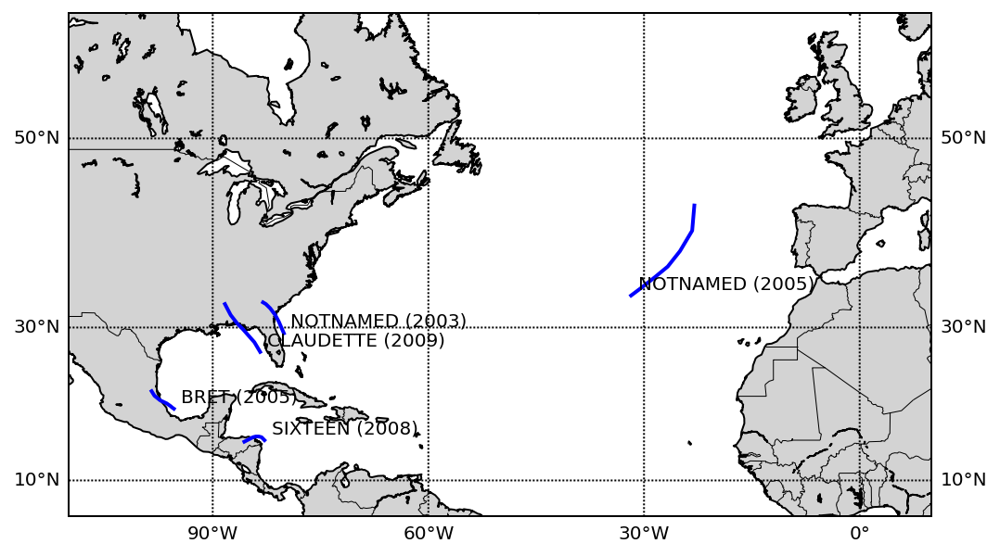

In [ ]:
# Graph the trajectories of the shortest hurricanes (the ones that traveled the least)
plt.figure(figsize=(10,5))
m = Basemap(llcrnrlon=-110.,llcrnrlat=5.,urcrnrlon=10.,urcrnrlat=60.,
            rsphere=(6378137.00,6356752.3142),
            resolution='l',
            projection='merc',
            lat_0=40.,lon_0=-20.,lat_ts=20.)
m.drawcoastlines()
m.drawcountries()
m.drawmapboundary(fill_color='white')
m.fillcontinents(color='#D3D3D3')
m.drawparallels(np.arange(10,90,20),labels=[1,1,0,1])
m.drawmeridians(np.arange(-180,180,30),labels=[1,1,0,1])

for x in hurricane_amount.nsmallest(n,0).index:
    largest_hurr = data[data['unique-key'] == keys[x][1]]
    lat = largest_hurr['Lat'].values
    long = largest_hurr['Long'].values
    xpt, ypt = m(long, lat)
    plt.text(xpt[0]+100000,ypt[0]+100000, '%s (%s)' % (keys[x][1].split('-')[0],keys[x][1].split('-')[1]))
    m.plot(xpt, ypt, linewidth=2, color='blue')
    
# plt.title('Smallest 5 Atlantic Hurricanes (Distance Traveled)')
# plt.savefig('smallest_dist_hurricanes')
plt.show()

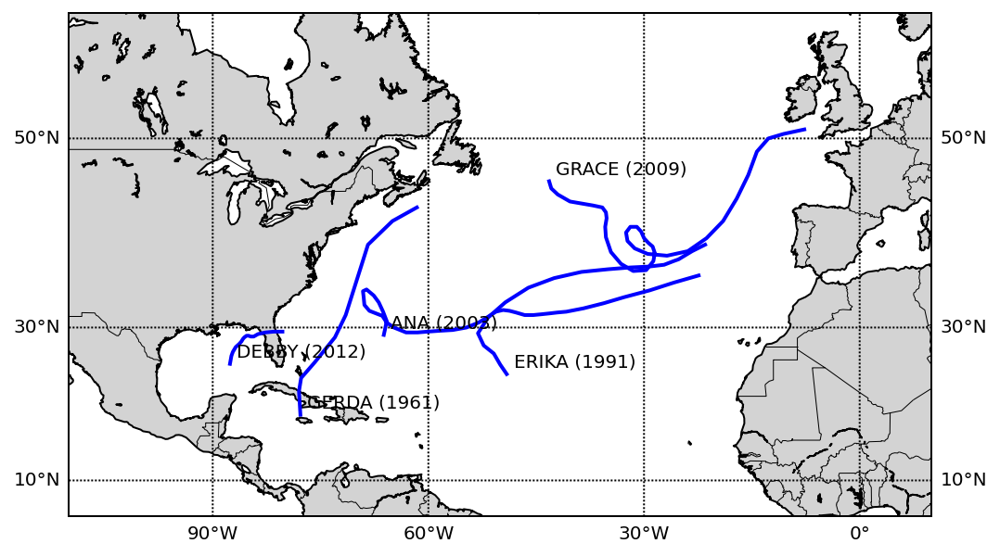

In [ ]:
# Graph the trajectories of 3 random hurricanes 
plt.figure(figsize=(10,5))
m = Basemap(llcrnrlon=-110.,llcrnrlat=5.,urcrnrlon=10.,urcrnrlat=60.,
            rsphere=(6378137.00,6356752.3142),
            resolution='l',
            projection='merc',
            lat_0=40.,lon_0=-20.,lat_ts=20.)
m.drawcoastlines()
m.drawcountries()
m.drawmapboundary(fill_color='white')
m.fillcontinents(color='#D3D3D3')
m.drawparallels(np.arange(10,90,20),labels=[1,1,0,1])
m.drawmeridians(np.arange(-180,180,30),labels=[1,1,0,1])

for x in np.random.choice(total_hurricane_count, n):
    largest_hurr = data[data['unique-key'] == keys[x][1]]
    lat = largest_hurr['Lat'].values
    long = largest_hurr['Long'].values
    xpt, ypt = m(long, lat)
    plt.text(xpt[0]+100000,ypt[0]+100000, '%s (%s)' % (keys[x][1].split('-')[0],keys[x][1].split('-')[1]))
    m.plot(xpt, ypt, linewidth=2, color='blue')
    
# plt.title('Random 5 Atlantic Hurricanes')
# plt.savefig('random_dist_hurricanes')
plt.show()

In [ ]:
data.head()

,Month,Day,Hour,Lat,Long,WindSpeed,Pressure,unique-key,distance,direction
116,8,13,18,22.5,-93.5,30.0,1008,BERYL-2000-5,0.000000,0.000000
117,8,14,0,22.7,-93.8,30.0,1008,BERYL-2000-5,23.604117,140.567975
118,8,14,6,23.1,-94.6,35.0,1007,BERYL-2000-5,57.935076,161.351184
119,8,14,12,23.5,-95.4,40.0,1009,BERYL-2000-5,57.802056,174.302218
120,8,14,18,23.9,-96.3,45.0,1009,BERYL-2000-5,63.292296,337.250833


In [ ]:
import scipy

dist = data[data['distance'] > 0]['distance']
scipy.stats.anderson(dist, dist='norm')

AndersonResult(statistic=814.215996183535, critical_values=array([0.576, 0.656, 0.787, 0.918, 1.092]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))

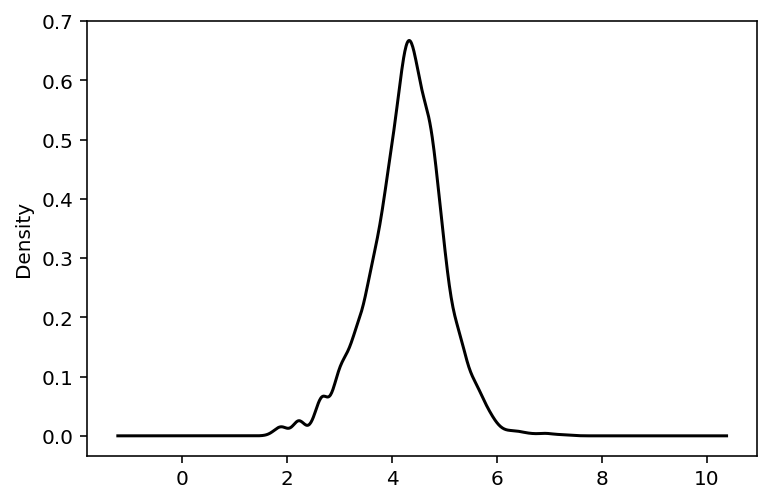

In [ ]:
# Distribution of distance traveled in a 6 hour time interval for all hurricanes
dist_log = np.log(dist)
ser = pd.Series(dist_log)
ser.plot(kind='kde', cmap='gray')
# plt.savefig('distance_dist')

In [ ]:
scipy.stats.anderson(dist_log, dist='norm')

AndersonResult(statistic=39.93006682406485, critical_values=array([0.576, 0.656, 0.787, 0.918, 1.092]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))

In [ ]:
import sklearn 

dist_norm = normalized = (dist-min(dist))/(max(dist)-min(dist))
scipy.stats.anderson(dist_norm, dist='norm')

AndersonResult(statistic=814.2159961835405, critical_values=array([0.576, 0.656, 0.787, 0.918, 1.092]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))

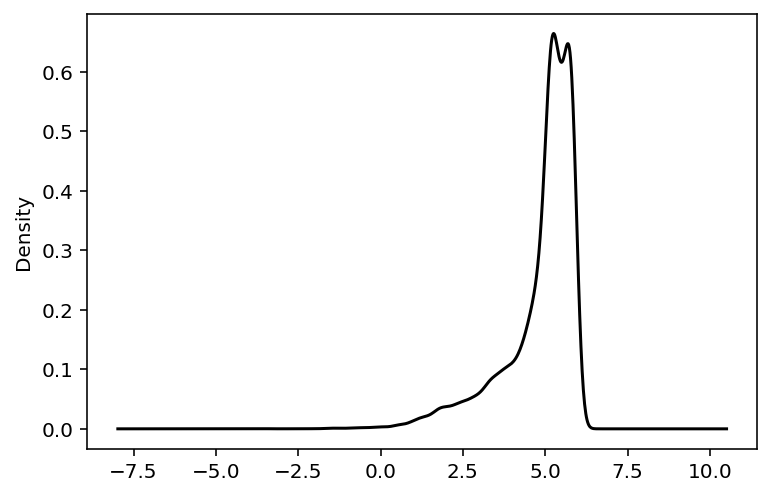

In [ ]:
# Distribution of angle traveled in a 6 hour time interval for all hurricanes
direc = data[data['direction'] > 0]
direc = np.log(direc['direction'])
ser = pd.Series(direc)
ser.plot(kind='kde', cmap='gray')
# plt.savefig('distance_dist')

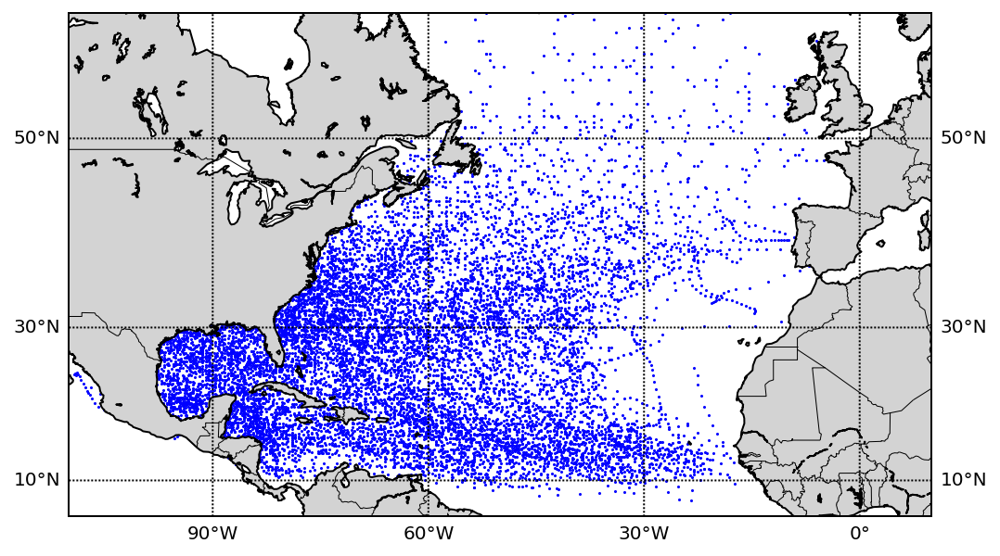

In [ ]:
# Graph all points 
plt.figure(figsize=(10,5))
m = Basemap(llcrnrlon=-110.,llcrnrlat=5.,urcrnrlon=10.,urcrnrlat=60.,
            rsphere=(6378137.00,6356752.3142),
            resolution='l',
            projection='merc',
            lat_0=40.,lon_0=-20.,lat_ts=20.)
m.drawcoastlines()
m.drawcountries()
m.drawmapboundary(fill_color='white')
m.fillcontinents(color='#D3D3D3')
m.drawparallels(np.arange(10,90,20),labels=[1,1,0,1])
m.drawmeridians(np.arange(-180,180,30),labels=[1,1,0,1])

lat = data['Lat'].values
long = data['Long'].values
xpt, ypt = m(long, lat)
m.scatter(xpt, ypt, .3, color='blue')

# plt.savefig('scatter_hurricanes')
plt.show()

In [ ]:
print(len(xpt))

13131


In [ ]:
# Assigning each point to a specific location in the grid. 
# For example, we will learn how a hurricane in quadrant 2 with move.
data['gridID'] = np.zeros(total_data_count)

In [ ]:
# These variable are hyperparameters
lat_min = 7.2
long_min = -109.3
lat_interval = round(66 - 7.2)
long_interval = round(13.5 + 109.3)

data['gridID'] = np.floor(data['Lat'] - 7.200)* long_interval  + np.floor(data['Long'] + 109.3)
data['gridID'] = round(data['gridID'])

In [ ]:
data.describe()

,Month,Day,Hour,Lat,Long,WindSpeed,Pressure,distance,direction,gridID
count,13131.000000,13131.000000,13131.000000,13131.000000,13131.000000,13131.000000,13131.000000,13131.000000,13131.000000,13131.000000
mean,8.724621,15.828269,9.186810,26.928840,-64.398149,50.883939,993.863834,89.040334,171.462696,2412.639174
std,1.375840,8.906905,6.729553,9.812459,20.182565,25.903755,18.023786,85.472364,112.500395,1210.856829
min,1.000000,1.000000,0.000000,7.200000,-109.300000,10.000000,882.000000,0.000000,0.000000,64.000000
25%,8.000000,8.000000,6.000000,18.900000,-80.700000,30.000000,987.000000,43.506747,70.936725,1406.000000
50%,9.000000,16.000000,12.000000,26.700000,-65.800000,45.000000,1000.000000,72.753758,177.126694,2374.000000
75%,10.000000,24.000000,18.000000,33.300000,-49.500000,65.000000,1007.000000,111.150007,264.471076,3226.000000
max,12.000000,31.000000,23.000000,66.000000,13.500000,165.000000,1024.000000,1766.824886,359.938162,7256.000000


In [ ]:
data.to_csv('checkpoint-dataframe.csv') # Save the dataframe to csv for checkpoint

### Build the Model

In [ ]:
data = pd.read_csv('checkpoint-dataframe.csv', index_col=0) 

In [ ]:
data.head() # Check loaded data

,Month,Day,Hour,Lat,Long,WindSpeed,Pressure,unique-key,distance,direction,gridID
116,8,13,18,22.5,-93.5,30.0,1008,BERYL-2000-5,0.000000,0.000000,1860.0
117,8,14,0,22.7,-93.8,30.0,1008,BERYL-2000-5,23.604117,140.567975,1860.0
118,8,14,6,23.1,-94.6,35.0,1007,BERYL-2000-5,57.935076,161.351184,1859.0
119,8,14,12,23.5,-95.4,40.0,1009,BERYL-2000-5,57.802056,174.302218,1981.0
120,8,14,18,23.9,-96.3,45.0,1009,BERYL-2000-5,63.292296,337.250833,1981.0


In [ ]:
names = data['unique-key'].unique()
data.drop(['Month', 'Day', 'Hour', 'Lat', 'Long'], axis = 1, inplace = True)
data.head()

,WindSpeed,Pressure,unique-key,distance,direction,gridID
116,30.0,1008,BERYL-2000-5,0.000000,0.000000,1860.0
117,30.0,1008,BERYL-2000-5,23.604117,140.567975,1860.0
118,35.0,1007,BERYL-2000-5,57.935076,161.351184,1859.0
119,40.0,1009,BERYL-2000-5,57.802056,174.302218,1981.0
120,45.0,1009,BERYL-2000-5,63.292296,337.250833,1981.0


In [ ]:
np.array(data)

array([[30.0, 1008, 'BERYL-2000-5', 0.0, 0.0, 1860.0],
       [30.0, 1008, 'BERYL-2000-5', 23.604116508448072,
        140.56797538055898, 1860.0],
       [35.0, 1007, 'BERYL-2000-5', 57.935075579874066,
        161.35118414564937, 1859.0],
       ...,
       [70.0, 975, 'NOTNAMED-1929-2', 479.9202138698258,
        32.902723473217954, 2852.0],
       [60.0, 975, 'NOTNAMED-1929-2', 22.61060368758486,
        19.576091043963004, 2852.0],
       [55.0, 986, 'NOTNAMED-1929-2', 82.46837457733908,
        58.54528785490512, 2854.0]], dtype=object)

In [ ]:
np.unique(data['unique-key'])

array(['ABBY-1968-1', 'AGNES-1972-2', 'ALBERTO-1982-1', 'ALBERTO-1988-1',
       'ALBERTO-1994-1', 'ALBERTO-2006-1', 'ALBERTO-2012-1',
       'ALEX-1998-1', 'ALEX-2004-1', 'ALEX-2010-1', 'ALICE-1973-4',
       'ALICIA-1983-3', 'ALLEN-1980-4', 'ALLISON-1989-2',
       'ALLISON-1995-1', 'ALLISON-2001-1', 'ALMA-1962-1', 'ALMA-1966-1',
       'ALMA-1970-1', 'ALPHA-1972-1', 'ALPHA-2005-26', 'AMY-1975-2',
       'ANA-1979-2', 'ANA-1985-1', 'ANA-1991-1', 'ANA-1997-2',
       'ANA-2003-1', 'ANA-2009-2', 'ANDREA-2007-1', 'ANDREW-1986-1',
       'ANDREW-1992-4', 'ANITA-1977-5', 'ANNA-1961-1', 'ANNA-1969-6',
       'ANNA-1976-6', 'ARLENE-1963-1', 'ARLENE-1967-11', 'ARLENE-1981-3',
       'ARLENE-1993-2', 'ARLENE-1999-1', 'ARLENE-2005-1', 'ARLENE-2011-1',
       'ARTHUR-1984-6', 'ARTHUR-1990-2', 'ARTHUR-1996-1', 'ARTHUR-2002-1',
       'ARTHUR-2008-1', 'BABE-1977-6', 'BARRY-1983-4', 'BARRY-1989-3',
       'BARRY-1995-2', 'BARRY-2001-3', 'BARRY-2007-2', 'BECKY-1970-2',
       'BELLE-1976-7', 'BERTH

In [ ]:
data_pad = []
for key in np.unique(data['unique-key']):
    data_pad += [data[ data.loc[:, 'unique-key'] == key].loc[:, ['WindSpeed', 'Pressure', 'distance', 'direction', 'gridID']]]

In [ ]:
data_pad[0:3]

[       WindSpeed  Pressure    distance   direction  gridID
 21217       30.0      1005    0.000000    0.000000  1376.0
 21220       40.0      1002  190.999054  230.915394  1746.0
 21221       45.0       997   73.125660  248.497817  1870.0
 21222       60.0       999   71.686942  348.773839  1993.0
 21223       65.0       999   85.050130   14.434896  2116.0
 21225       65.0       994   45.526444   17.180714  2117.0
 21226       60.0       993   54.424009   18.917150  2240.0
 21227       55.0       992   90.717511  350.544696  2364.0
 21230       50.0       994  110.827466  292.193468  2488.0
 21232       50.0       965   47.486532  321.421596  2489.0
 21233       50.0       997   18.441810  348.103154  2489.0
 21237       50.0       999  201.090838  223.305339  2856.0,
        WindSpeed  Pressure    distance   direction  gridID
 15374       30.0      1001    0.000000    0.000000  1498.0
 15376       40.0       998   51.941213  147.232643  1499.0
 15384       65.0       986  265.356052

In [ ]:
len(data)
len(data_pad)
len_vals = []
for x in range(len(data_pad)):
    len_vals += [len(data_pad[x])]
print(max(len_vals))

59


In [ ]:
import keras 
padded_data = keras.preprocessing.sequence.pad_sequences(data_pad, maxlen=60, dtype='int32', padding='post', truncating='pre', value=0.0)

In [ ]:
padded_data[7]

array([[  25, 1009,    0,    0,  575],
       [  25, 1009,  124,  290,  574],
       [  25, 1009,  139,  301,  572],
       [  25, 1008,  144,  276,  693],
       [  30, 1007,  136,  241,  691],
       [  30, 1006,  121,  248,  689],
       [  35, 1005,  115,  303,  810],
       [  35, 1005,  115,  310,  808],
       [  35, 1005,  101,  215,  807],
       [  35, 1005,   88,  194,  806],
       [  35, 1005,   89,   16,  804],
       [  40, 1003,   88,   14,  926],
       [  40, 1003,   76,   63,  925],
       [  45, 1003,   78,  130,  924],
       [  45, 1002,   69,  111, 1046],
       [  45, 1003,   67,   65, 1045],
       [  45, 1003,   73,   65, 1044],
       [  40, 1005,   80,   98, 1042],
       [  35, 1007,   86,  106, 1041],
       [  35, 1009,   96,   59, 1163],
       [  40, 1009,   89,   26, 1162],
       [  40, 1012,   91,  213, 1283],
       [  35, 1012,   86,  240, 1405],
       [  35, 1012,   88,  292, 1404],
       [  35, 1012,   85,  251, 1526],
       [  30, 1014,   88,

In [ ]:
# Total grid spots
max(data['gridID']) 

7256.0

In [ ]:
# Values are normalized to predict them more easily in our model
scalers = {}
gridScalers = {}
for name in names:
    scalers[name] = MinMaxScaler(feature_range=(0, 1))
    hurricane = data[data['unique-key'] == name]
    hurricane.drop('unique-key', axis = 1, inplace= True)
    
    hurricane = pd.DataFrame(scalers[name].fit_transform(hurricane), columns=['WindSpeed',
                                                                              'Pressure',
                                                                              'distance',
                                                                              'direction', 
                                                                              'gridID'])
    data.loc[data['unique-key'] == name, ['WindSpeed', 'Pressure', 'distance', 'direction', 'gridID']] = hurricane.values

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/pandas/core/frame.p

In [ ]:
data.head()

,WindSpeed,Pressure,unique-key,distance,direction,gridID
116,0.25,0.2,BERYL-2000-5,0.000000,0.000000,0.002747
117,0.25,0.2,BERYL-2000-5,0.302926,0.412575,0.002747
118,0.50,0.0,BERYL-2000-5,0.743516,0.473574,0.000000
119,0.75,0.4,BERYL-2000-5,0.741808,0.511586,0.335165
120,1.00,0.4,BERYL-2000-5,0.812268,0.989849,0.335165


In [ ]:
data_pad = []
for key in np.unique(data['unique-key']):
    data_pad += [data[ data.loc[:, 'unique-key'] == key].loc[:, ['WindSpeed', 'Pressure', 'distance', 'direction', 'gridID']]]

In [ ]:
data_pad[1]

,WindSpeed,Pressure,distance,direction,gridID
15374,0.000000,1.000000,0.000000,0.000000,0.000000
15376,0.222222,0.875000,0.160248,0.410819,0.000385
15384,0.777778,0.375000,0.818671,0.037548,0.189908
15385,0.777778,0.250000,0.214049,0.531265,0.237288
15386,1.000000,0.208333,0.255799,0.502249,0.284669
15387,1.000000,0.041667,0.255799,0.502249,0.379430
15388,1.000000,0.041667,0.277115,0.000000,0.426810
15389,0.777778,0.250000,0.235221,1.000000,0.474191
15391,0.000000,0.541667,0.417785,0.232419,0.569337
15393,0.000000,0.625000,0.468836,0.031535,0.617488


In [ ]:
padded_data = keras.preprocessing.sequence.pad_sequences(data_pad, maxlen=60, dtype='float', padding='post', truncating='pre', value=0.0)

In [ ]:
padded_data[0]

array([[0.        , 1.        , 0.        , 0.        , 0.        ],
       [0.28571429, 0.925     , 0.9498148 , 0.6587331 , 0.25      ],
       [0.42857143, 0.8       , 0.36364491, 0.70889053, 0.33378378],
       [0.85714286, 0.85      , 0.35649035, 0.99494827, 0.41689189],
       [1.        , 0.85      , 0.42294383, 0.04117848, 0.5       ],
       [1.        , 0.725     , 0.22639741, 0.04901148, 0.50067568],
       [0.85714286, 0.7       , 0.2706439 , 0.05396502, 0.58378378],
       [0.71428571, 0.675     , 0.45112703, 1.        , 0.66756757],
       [0.57142857, 0.725     , 0.55113136, 0.83354126, 0.75135135],
       [0.57142857, 0.        , 0.23614468, 0.91692044, 0.75202703],
       [0.57142857, 0.8       , 0.09170885, 0.993035  , 0.75202703],
       [0.57142857, 0.85      , 1.        , 0.63702387, 1.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.

In [ ]:
print(len(padded_data[0]))
print(len(padded_data))

60
539


In [ ]:
temp_flat = padded_data.reshape(60*539,5)
print(temp_flat[0:200])
print(temp_flat.shape)

[[0.00000000e+00 1.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00]
 [2.85714286e-01 9.25000000e-01 9.49814800e-01 6.58733098e-01
  2.50000000e-01]
 [4.28571429e-01 8.00000000e-01 3.63644912e-01 7.08890533e-01
  3.33783784e-01]
 [8.57142857e-01 8.50000000e-01 3.56490346e-01 9.94948268e-01
  4.16891892e-01]
 [1.00000000e+00 8.50000000e-01 4.22943834e-01 4.11784754e-02
  5.00000000e-01]
 [1.00000000e+00 7.25000000e-01 2.26397407e-01 4.90114784e-02
  5.00675676e-01]
 [8.57142857e-01 7.00000000e-01 2.70643902e-01 5.39650168e-02
  5.83783784e-01]
 [7.14285714e-01 6.75000000e-01 4.51127025e-01 1.00000000e+00
  6.67567568e-01]
 [5.71428571e-01 7.25000000e-01 5.51131357e-01 8.33541260e-01
  7.51351351e-01]
 [5.71428571e-01 0.00000000e+00 2.36144682e-01 9.16920436e-01
  7.52027027e-01]
 [5.71428571e-01 8.00000000e-01 9.17088519e-02 9.93035004e-01
  7.52027027e-01]
 [5.71428571e-01 8.50000000e-01 1.00000000e+00 6.37023870e-01
  1.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.000000

In [ ]:
def load_data(stock, seq_len, amount_of_features):
#     amount_of_features = len(stock.columns)
#     data = stock.as_matrix() 
    sequence_length = seq_len + 1 # Because index starts at 0
    result = []

    for index in range(len(stock) - sequence_length):
        seq = stock[index: index + sequence_length]
        result.append(seq)
    
    result = np.array(result)
    row = len(result) * 0.85 # Amount of data to train on    
    train = result[:int(row), :]
    x_train = train[:, :-1]
    y_train = train[:, -1][:,-1]
    x_test = result[int(row):, :-1]
    y_test = result[int(row):, -1][:,-1]

    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], amount_of_features))
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], amount_of_features))  

    return [x_train, y_train, x_test, y_test]

In [ ]:
def build_model(layers):
    model = Sequential()

    for x in range(0,3):
        model.add(LSTM(return_sequences=True,input_shape=(None, 5), units=12))
        model.add(Dropout(0.1))

    model.add(LSTM(layers[2], return_sequences=False)) 
    model.add(Dropout(0.1))

    model.add(Dense(units=1))
    model.add(Activation("tanh"))

    start = time.time()
    model.compile(loss="mse", optimizer="rmsprop",metrics=['accuracy'])
    print("Compilation Time : ", time.time() - start)
    return model

### Train the Model

In [ ]:
seq_len = 12 # Another hyperparameter- length of hurricane?
feature_count = 5
X_train, y_train, X_test, y_test = load_data(temp_flat[::-1], seq_len, feature_count)
print("X_train", X_train.shape)
print("y_train", y_train.shape)
print("X_test", X_test.shape)
print("y_test", y_test.shape)

X_train (27477, 12, 5)
y_train (27477,)
X_test (4850, 12, 5)
y_test (4850,)


In [ ]:
model = build_model([feature_count, seq_len, 1])

Compilation Time :  0.011228322982788086


In [ ]:
model.fit(X_train, y_train, batch_size=512, epochs=200, validation_split=0.1, verbose=1)

Epoch 1/200
49/49 [==============================] - 11s 103ms/step - loss: 0.1027 - accuracy: 0.6036 - val_loss: 0.0719 - val_accuracy: 0.6477
Epoch 2/200
49/49 [==============================] - 2s 46ms/step - loss: 0.0769 - accuracy: 0.6110 - val_loss: 0.0642 - val_accuracy: 0.6481
Epoch 3/200
49/49 [==============================] - 2s 38ms/step - loss: 0.0691 - accuracy: 0.6027 - val_loss: 0.0584 - val_accuracy: 0.6467
Epoch 4/200
49/49 [==============================] - 2s 48ms/step - loss: 0.0604 - accuracy: 0.6035 - val_loss: 0.0469 - val_accuracy: 0.6459
Epoch 5/200
49/49 [==============================] - 2s 44ms/step - loss: 0.0522 - accuracy: 0.6072 - val_loss: 0.0431 - val_accuracy: 0.6474
Epoch 6/200
49/49 [==============================] - 2s 44ms/step - loss: 0.0481 - accuracy: 0.6042 - val_loss: 0.0342 - val_accuracy: 0.6488
Epoch 7/200
49/49 [==============================] - 2s 44ms/step - loss: 0.0418 - accuracy: 0.6058 - val_loss: 0.0292 - val_accuracy: 0.6496
Epoc

In [170]:
trainScore = model.evaluate(X_train, y_train, verbose=0)
print('Train Score: %.4f MSE (%.4f RMSE)' % (trainScore[0], math.sqrt(trainScore[0])))

testScore = model.evaluate(X_test, y_test, verbose=0)
print('Test Score: %.4f MSE (%.4f RMSE)' % (testScore[0], math.sqrt(testScore[0])))

Train Score: 0.0186 MSE (0.1364 RMSE)
Test Score: 0.0183 MSE (0.1352 RMSE)


In [ ]:
#Saving model for exporting

# Serialize model to JSON
model_json = model.to_json()
with open("model_sheils.json", "w") as json_file:
    json_file.write(model_json)

# Serialize weights to HDF5
model.save_weights("model_sheils.h5")
print("Saved Model to Disk")

### Predicting Hurricane Trajectory

In [ ]:
# Load json and create model
json_file = open('model_sheils.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)

# Load weights into new model
loaded_model.load_weights("model_sheils.h5")
print("Loaded Model from Disk")
model = loaded_model

# Evaluate loaded model on test data
#loaded_model.compile(loss='mse', optimizer='rmsprop', metrics=['accuracy'])
#score = loaded_model.evaluate(X, Y, verbose=0)
#print("%s: %.2f%%" % (loaded_model.metrics_names[1], score[1]*100))

Loaded Model from Disk


In [171]:
pred = model.predict(X_test)

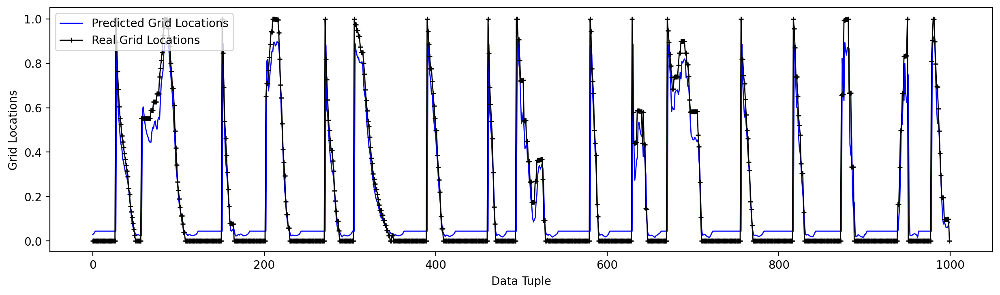

In [172]:
plt.figure(figsize=(15, 4), dpi=100)
plt.plot(pred[:1000],
         linewidth=1, 
         color='blue', 
         label='Predicted Grid Locations')
plt.plot(y_test[:1000],
         linewidth=1, 
         color='black',
         marker='+',
         markersize=4,
         label='Real Grid Locations')
# plt.savefig('denormalized_predictions')
plt.xlabel('Data Tuple')
plt.ylabel('Grid Locations')

plt.legend(loc='upper left')
# plt.savefig('grid_accuracy.png')
plt.show()

In [173]:
len(pred)

4850

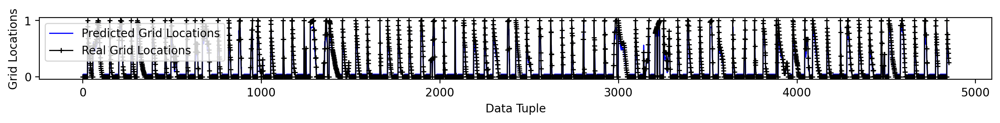

In [174]:
plt.figure(figsize=(15, 1), dpi=100)
plt.plot(pred,
         linewidth=1, 
         color='blue', 
         label='Predicted Grid Locations')
plt.plot(y_test,
         linewidth=1, 
         color='black',
         marker='+',
         markersize=4,
         label='Real Grid Locations')
# plt.savefig('denormalized_predictions')
plt.xlabel('Data Tuple')
plt.ylabel('Grid Locations')

plt.legend(loc='upper left')
# plt.savefig('grid_accuracy.png')
plt.show()

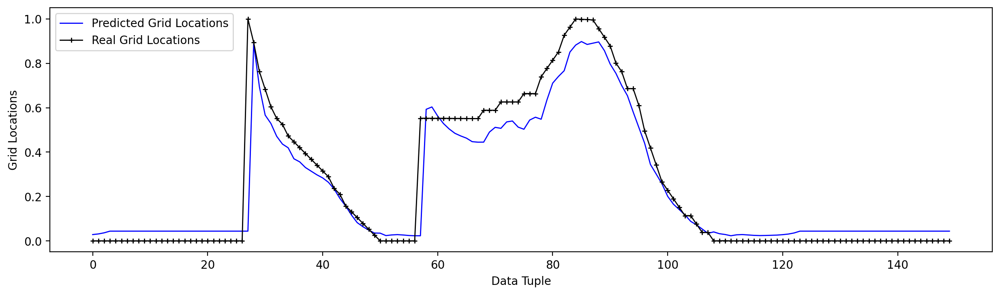

In [175]:
plt.figure(figsize=(15, 4), dpi=100)
plt.plot(pred[:150],
         linewidth=1, 
         color='blue', 
         label='Predicted Grid Locations')
plt.plot(y_test[:150],
         linewidth=1, 
         color='black',
         marker='+',
         markersize=4,
         label='Real Grid Locations')
# plt.savefig('denormalized_predictions')
plt.xlabel('Data Tuple')
plt.ylabel('Grid Locations')

plt.legend(loc='upper left')
# plt.savefig('grid_accuracy.png')
plt.show()

In [176]:
pred[0:60].flatten()

array([0.02828764, 0.03117905, 0.03620693, 0.04368396, 0.04368396,
       0.04368396, 0.04368396, 0.04368396, 0.04368396, 0.04368396,
       0.04368396, 0.04368396, 0.04368396, 0.04368396, 0.04368396,
       0.04368396, 0.04368396, 0.04368396, 0.04368396, 0.04368396,
       0.04368396, 0.04368396, 0.04368396, 0.04368396, 0.04368396,
       0.04368396, 0.04368396, 0.04368396, 0.88740784, 0.6935712 ,
       0.56655383, 0.5288712 , 0.47126764, 0.43617737, 0.4193861 ,
       0.3698055 , 0.3560069 , 0.3304546 , 0.3140545 , 0.29749537,
       0.28364152, 0.26391122, 0.23320663, 0.1910284 , 0.1567789 ,
       0.11666201, 0.08225632, 0.06370367, 0.04854571, 0.03521639,
       0.03463759, 0.02366743, 0.02663064, 0.02804484, 0.02636769,
       0.02402771, 0.02297465, 0.022886  , 0.5928225 , 0.6034373 ],
      dtype=float32)

In [177]:
flat_pred = pred.flatten()

In [178]:
y_test[0:80]

array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 1.        , 0.89409499, 0.7623021 ,
       0.68335473, 0.60419341, 0.55156183, 0.52524604, 0.47261446,
       0.44629867, 0.42019683, 0.39388104, 0.36756525, 0.34124947,
       0.31514763, 0.28883184, 0.23620026, 0.20988447, 0.15746684,
       0.13115105, 0.10483526, 0.07851947, 0.05241763, 0.02610184,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.55253399, 0.55253399, 0.55222497,
       0.55222497, 0.55222497, 0.55191595, 0.55160692, 0.55160692,
       0.5512979 , 0.55098888, 0.55098888, 0.58868974, 0.58838072,
       0.58838072, 0.62608158, 0.62608158, 0.62608158, 0.62608

In [179]:
hurr_real = []
hurr_pred = []
temp_real = []
temp_pred = []
for x in range(len(y_test)):
#     print(y_test[x])
    if not y_test[x] == 0:
        temp_real += [y_test[x]]
#         print(len(temp_real))
        temp_pred += [flat_pred[x]]
#         print(len(temp_pred))
    else:
        hurr_real += [temp_real]
#             print(hurr_real)
        hurr_pred += [temp_pred]
#             print(hurr_pred)
#             print(' ')
#             plt.plot(hurr_real, hurr_pred)
        temp_real = []
        temp_pred = []
        

In [180]:
print(len(hurr_real))
print(len(hurr_pred))

lol_real = [x for x in hurr_real if bool(x)]
print(len(lol_real))
lol_pred = [x for x in hurr_pred if bool(x)]
print(len(lol_pred))

3132
3132
112
112


In [181]:
len(data[data['unique-key'] == 'NOTNAMED-1929-2'])

7

In [182]:
data.tail(10)

,WindSpeed,Pressure,unique-key,distance,direction,gridID
33057,0.434783,0.594937,NOTNAMED-1928-4,0.013386,0.521893,0.549296
33064,0.086957,1.000000,NOTNAMED-1928-4,0.618161,1.000000,0.861408
33066,0.000000,0.924051,NOTNAMED-1928-4,0.272938,0.580343,1.000000
33151,1.000000,0.000000,NOTNAMED-1929-2,0.000000,0.000000,0.172789
33152,0.875000,0.193548,NOTNAMED-1929-2,0.077604,1.000000,0.172789
33162,0.562500,0.387097,NOTNAMED-1929-2,0.445537,0.049159,0.000000
33163,0.562500,0.387097,NOTNAMED-1929-2,0.019433,0.551499,0.000000
33174,0.187500,0.822581,NOTNAMED-1929-2,1.000000,0.097627,0.997279
33175,0.062500,0.822581,NOTNAMED-1929-2,0.047113,0.058085,0.997279
33176,0.000000,1.000000,NOTNAMED-1929-2,0.171838,0.173712,1.000000


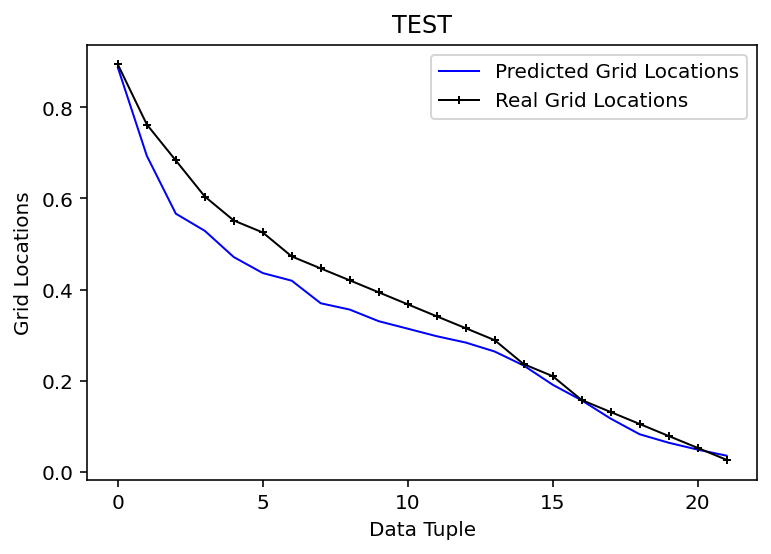

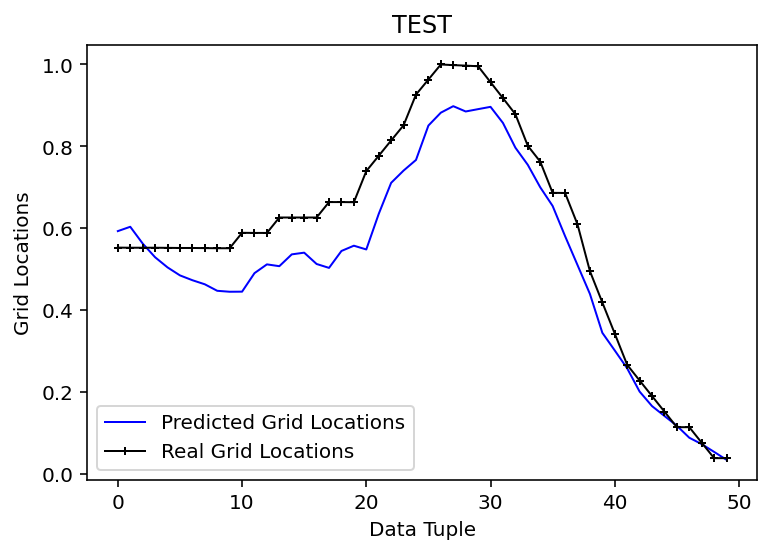

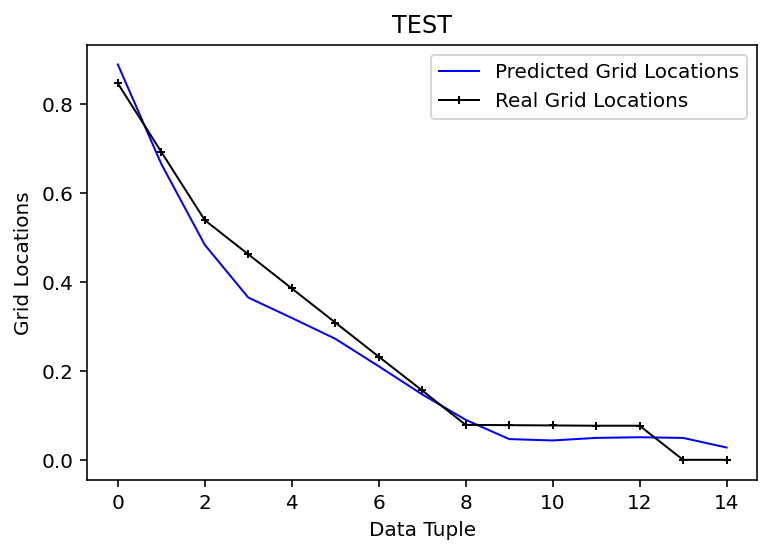

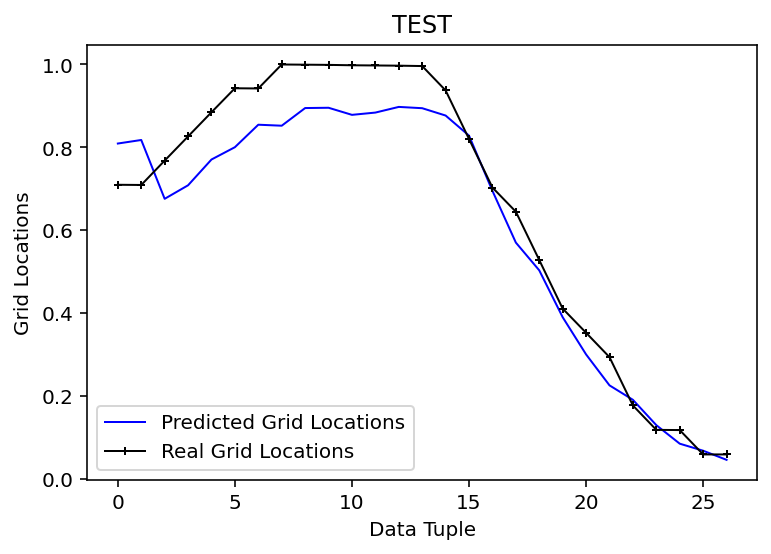

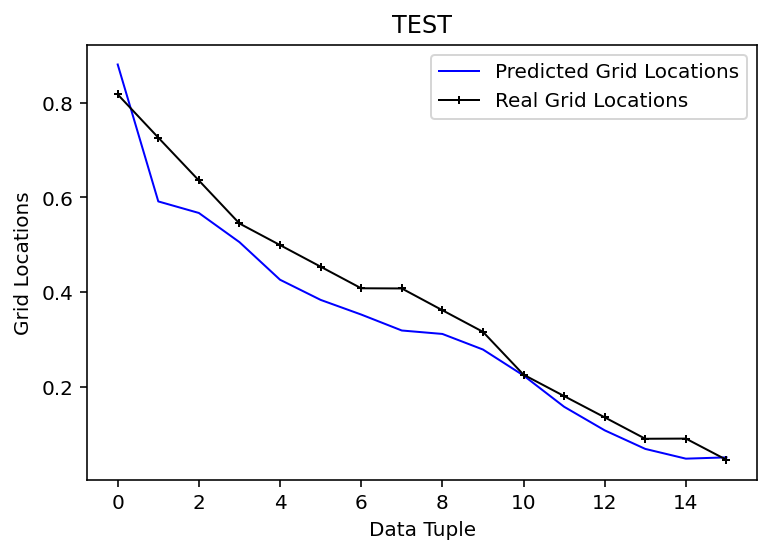

...

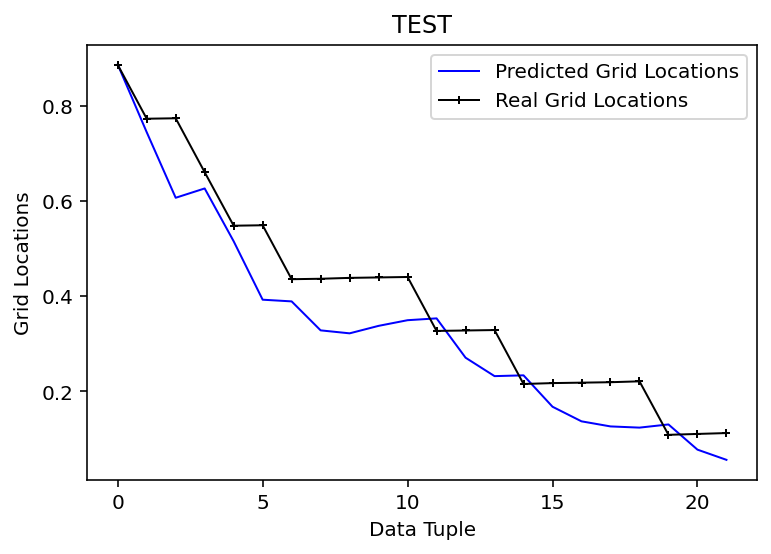

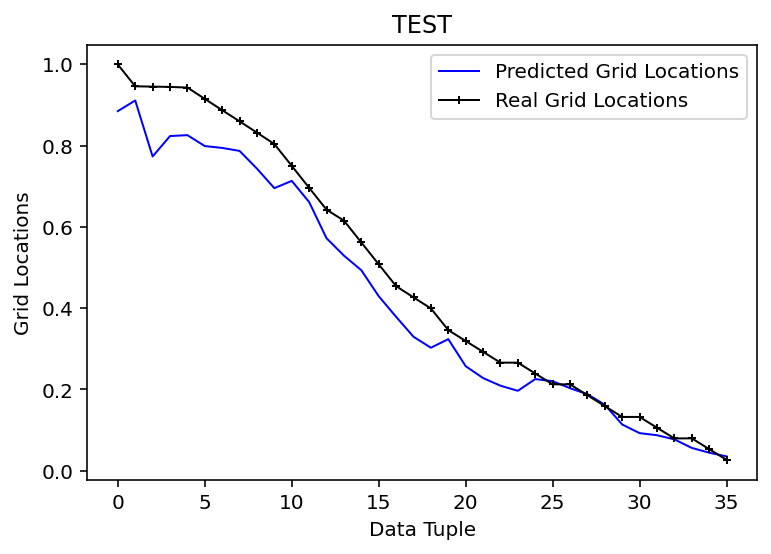

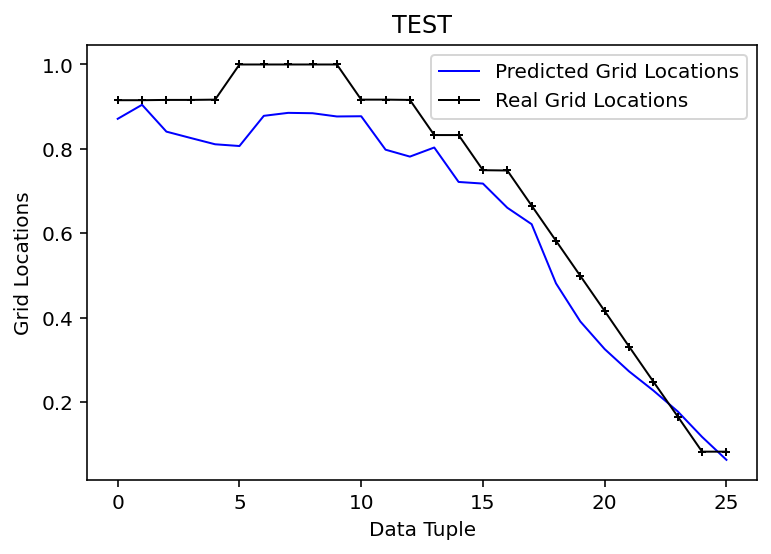

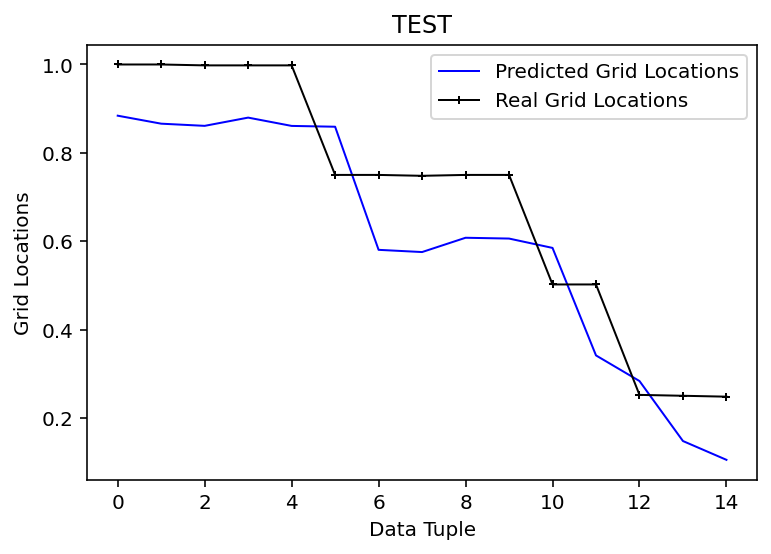

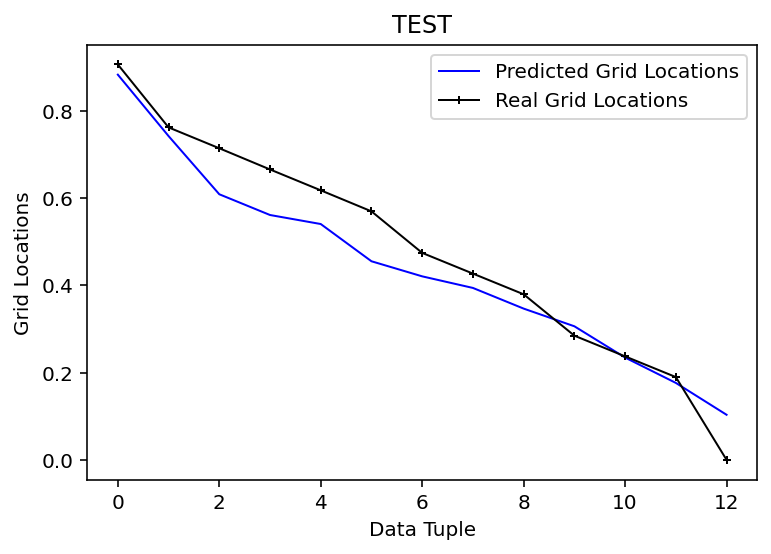

In [183]:
for x in range(len(lol_real)):
    if len(lol_real[x]) > 12:
        plt.plot(lol_pred[x][1:], linewidth=1, color='blue', label='Predicted Grid Locations')
        plt.plot(lol_real[x][1:], linewidth=1, color='black', marker='+', markersize=4, label='Real Grid Locations')
        plt.title('TEST')
        plt.xlabel('Data Tuple')
        plt.ylabel('Grid Locations')
        plt.legend()
        plt.show()

In [184]:
print(len(lol_real))
print(len(lol_pred))

112
112


In [185]:
print(list(range(12, len(lol_pred[x]))))

[12, 13]


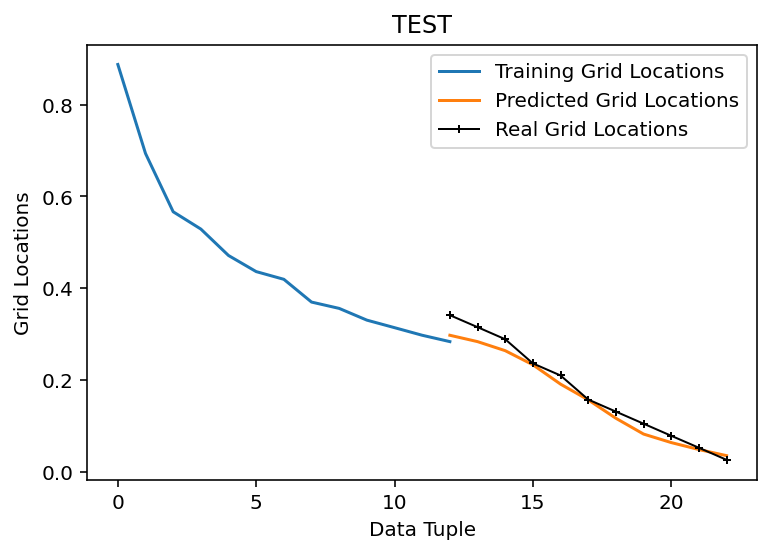

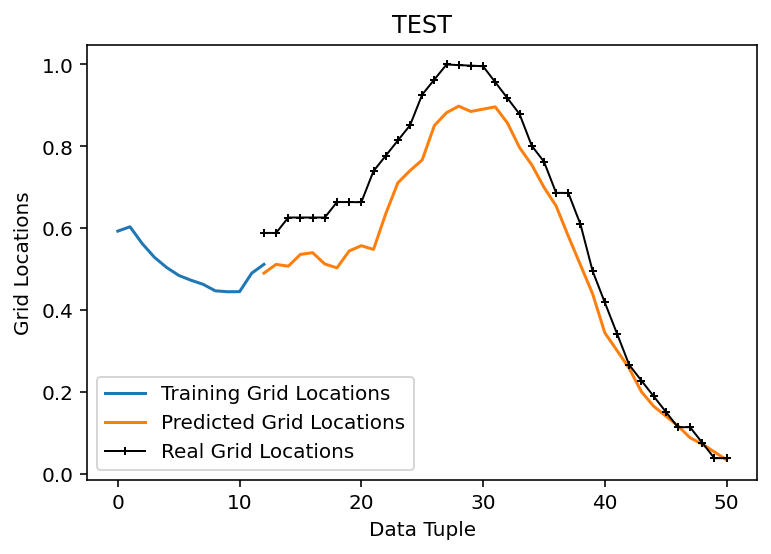

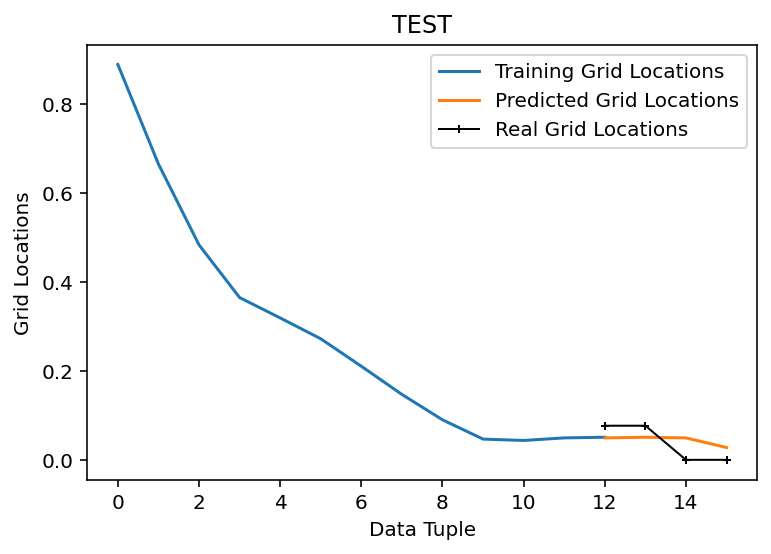

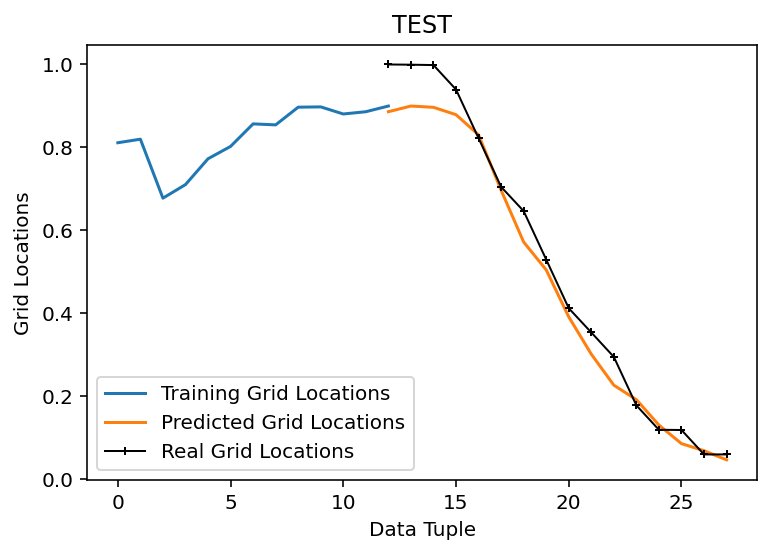

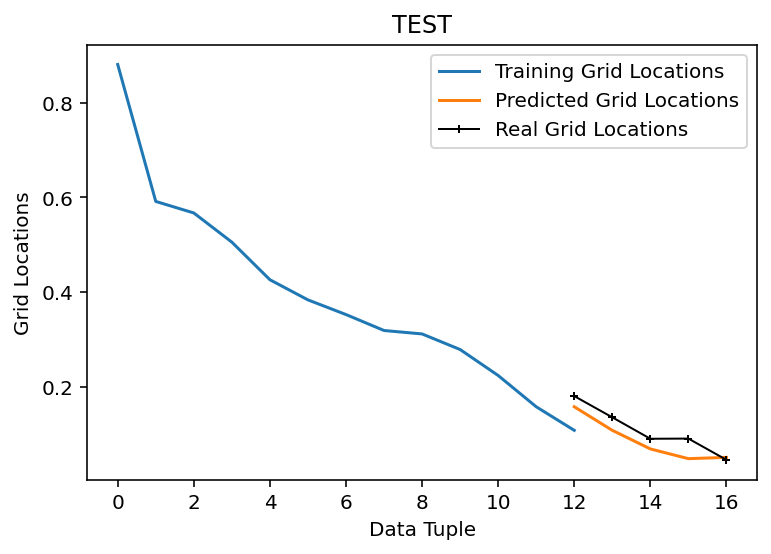

...

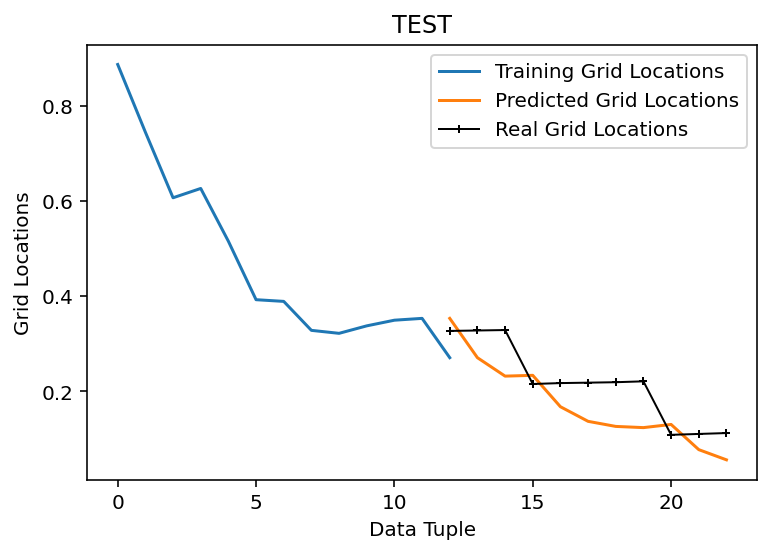

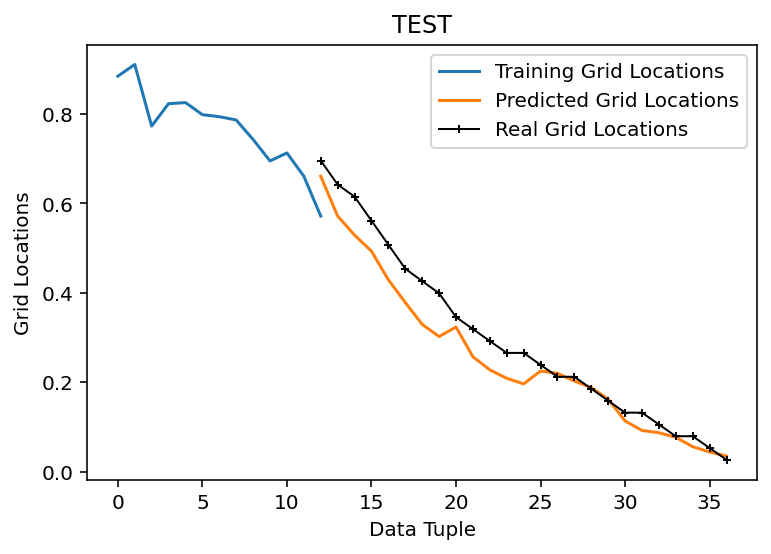

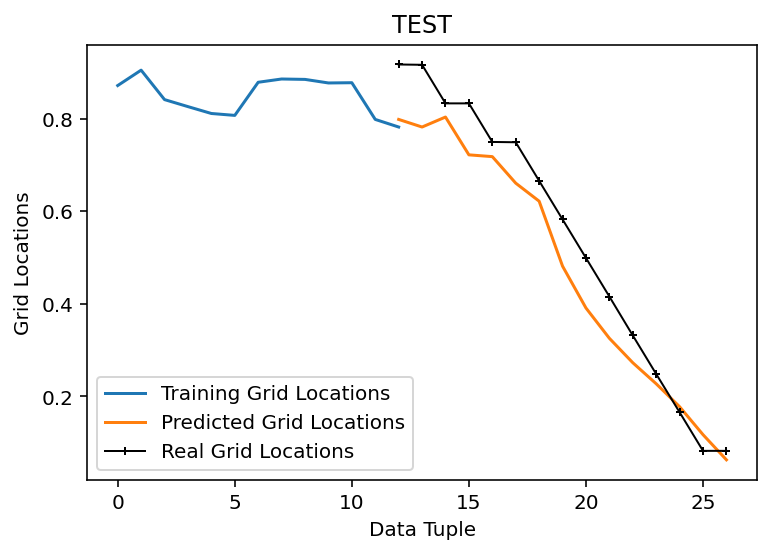

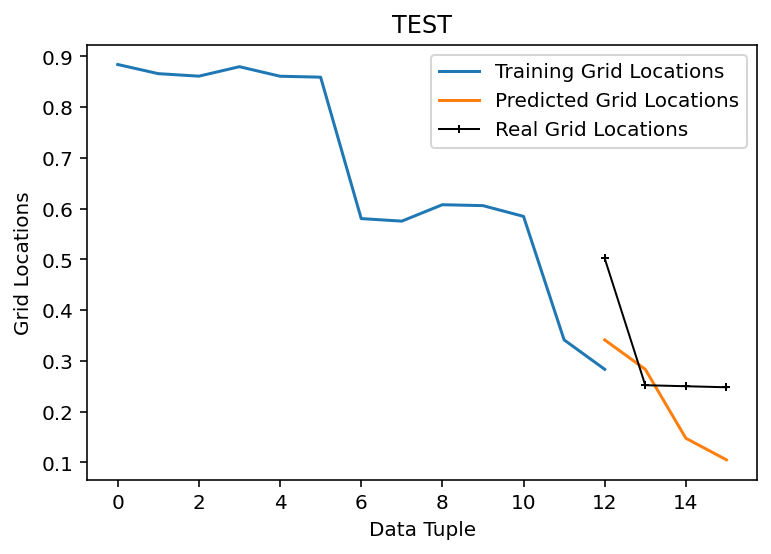

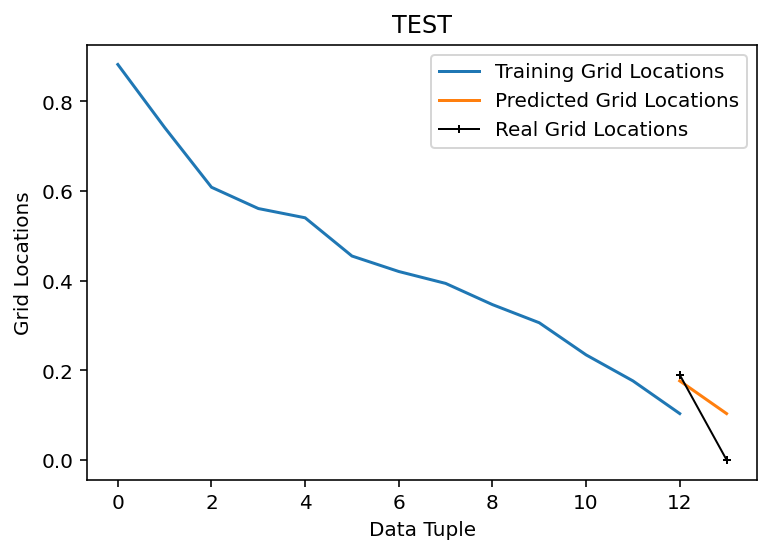

In [187]:
for x in range(len(lol_real)):
    if len(lol_real[x]) > 12:
#         
        plt.plot(lol_pred[x][1:14], label='Training Grid Locations')
        plt.plot(list(range(12, len(lol_pred[x]))), lol_pred[x][12:], label='Predicted Grid Locations')
        plt.plot(list(range(12, len(lol_pred[x]))), lol_real[x][12:], linewidth=1, color='black', marker='+', markersize=4, label='Real Grid Locations')
        plt.title('TEST')
        plt.xlabel('Data Tuple')
        plt.ylabel('Grid Locations')
        plt.legend()
        plt.show()

In [188]:
years = [2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017]
nhc_error = [107.4, 94.4, 101.2, 96.6, 86.2, 87.5, 70.1, 89.1, 70.8, 68.8, 102.5, 64.8, 77.4, 61.8, 56.4]
gpra_target = [130, 129, 128, 111, 110, 109, 108, 90, 87, 84, 81, 77, 77, 71, 68]
rnn_error = [60, 60, 60, 60, 60, 60, 60, 50, 50, 50, 50, 50, 50, 50, 50]

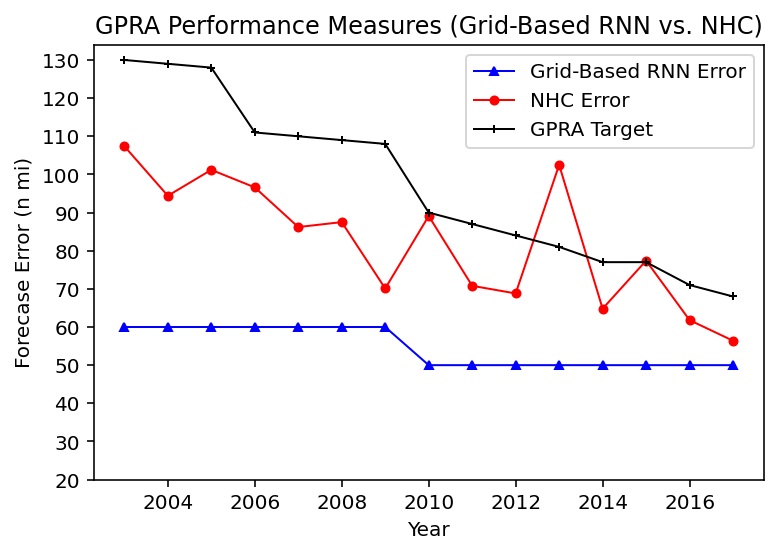

In [189]:
plt.plot(years, rnn_error, linewidth=1, color='blue', marker='^', markersize=4, label='Grid-Based RNN Error')
plt.plot(years, nhc_error, linewidth=1, color='red', marker='o', markersize=4, label='NHC Error')
plt.plot(years, gpra_target, linewidth=1, color='black', marker='+', markersize=4, label='GPRA Target')
plt.title('GPRA Performance Measures (Grid-Based RNN vs. NHC)')
plt.ylabel('Forecase Error (n mi)')
plt.xlabel('Year')
plt.yticks(range(20, 140, 10))
plt.legend()
plt.show()

In [ ]:
# pred_test = model.predict(X_test)

In [190]:
from sklearn.preprocessing import MinMaxScaler

def grid2coord(grid):
    y = np.floor(grid/long_interval) #y_coord
    x = np.floor(grid-y*long_interval) #x_coord
    #x and y represent the bottom left corner of the grid
    return (x+0.5+long_min, y+0.5+lat_min)

def pad_with(vector, pad_width, iaxis, kwargs):
    pad_value = kwargs.get('padder', 10)
    vector[:pad_width[0]] = pad_value
    vector[-pad_width[1]:] = pad_value
    return vector

def load_hurricane(stock, seq_len):#load a single hurricane
    amount_of_features = len(stock.columns)
    #data = stock.as_matrix()
    data = stock.values
    #size = np.prod(data.shape)
    sequence_length = seq_len + 1 # Because index starts at 0
    result = []

    for index in range(len(data) - sequence_length):
        seq = data[index: index + sequence_length]
        result.append(seq)
                
    result = np.array(result)
    result = result[:,:-1]
    return np.reshape(result, (result.shape[0], result.shape[1], amount_of_features))

def prep_hurricane(hurr, name):
    data_pad = [hurr[ hurr.loc[:, 'unique-key'] == name].loc[:, ['WindSpeed', 'Pressure', 'distance', 'direction', 'gridID']]]
    hurr.drop(['Month', 'Day', 'Hour', 'Lat', 'Long', 'unique-key'], axis = 1, inplace = True)
    hurr = hurr[hurr['distance'] > 0]

    hurr['distance'] = np.log(hurr['distance'])

    hurr = hurr[hurr['direction'] > 0]
    hurr['direction'] = np.log(hurr['direction'])
    
#     print (hurr)
#     print ()
#     print (data_pad)
    padded_data = keras.preprocessing.sequence.pad_sequences(data_pad, maxlen=60, dtype='int32', padding='post', truncating='pre', value=0.0)
    
#     print(padded_data)
    return pd.DataFrame(scalers[name].fit_transform(padded_data[0]), columns=['WindSpeed', 'Pressure', 'Distance', 'Direction', 'gridID'])
    
def test():
    data = pd.read_csv('checkpoint-dataframe.csv', index_col=0, header=0)
    name = 'MICHAEL-2000-17' # Hurricane Key

    window = 5
    hurricane = prep_hurricane(data[data['unique-key'] == name], name) # This is good

    hurr_data = load_hurricane(hurricane[::-1], window)
    return hurr_data.shape
# print(test())

In [191]:
model.summary()
model.get_config()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_4 (LSTM)                (None, None, 12)          864       
_________________________________________________________________
dropout_7 (Dropout)          (None, None, 12)          0         
_________________________________________________________________
lstm_5 (LSTM)                (None, None, 12)          1200      
_________________________________________________________________
dropout_8 (Dropout)          (None, None, 12)          0         
_________________________________________________________________
lstm_6 (LSTM)                (None, None, 12)          1200      
_________________________________________________________________
dropout_9 (Dropout)          (None, None, 12)          0         
_________________________________________________________________
lstm_7 (LSTM)                (None, 1)                

{'layers': [{'class_name': 'InputLayer',
   'config': {'batch_input_shape': (None, None, 5),
    'dtype': 'float32',
    'name': 'lstm_4_input',
    'ragged': False,
    'sparse': False}},
  {'class_name': 'LSTM',
   'config': {'activation': 'tanh',
    'activity_regularizer': None,
    'batch_input_shape': (None, None, 5),
    'bias_constraint': None,
    'bias_initializer': {'class_name': 'Zeros', 'config': {}},
    'bias_regularizer': None,
    'dropout': 0.0,
    'dtype': 'float32',
    'go_backwards': False,
    'implementation': 2,
    'kernel_constraint': None,
    'kernel_initializer': {'class_name': 'GlorotUniform',
     'config': {'seed': None}},
    'kernel_regularizer': None,
    'name': 'lstm_4',
    'recurrent_activation': 'sigmoid',
    'recurrent_constraint': None,
    'recurrent_dropout': 0.0,
    'recurrent_initializer': {'class_name': 'Orthogonal',
     'config': {'gain': 1.0, 'seed': None}},
    'recurrent_regularizer': None,
    'return_sequences': True,
    'retur

20


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


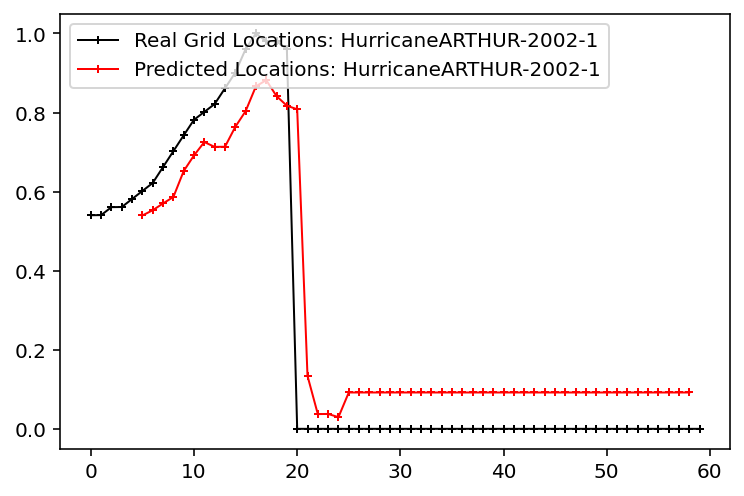

23


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


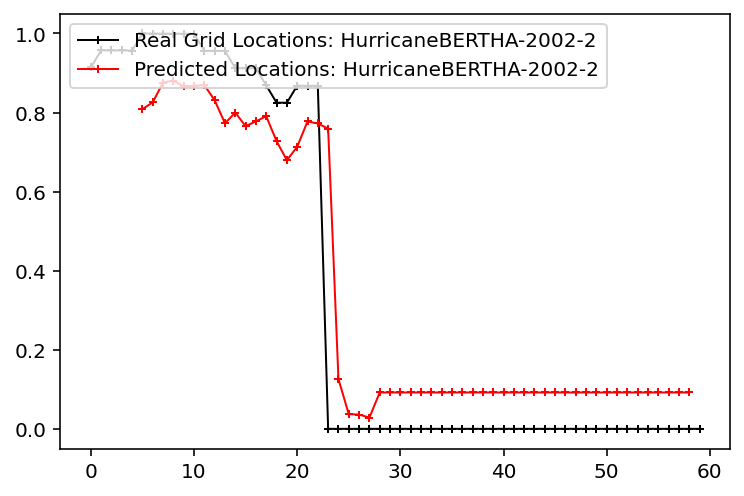

13


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


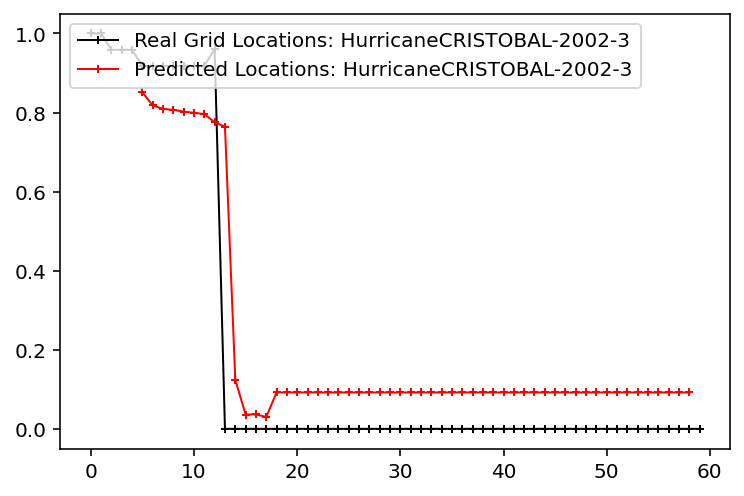

26


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


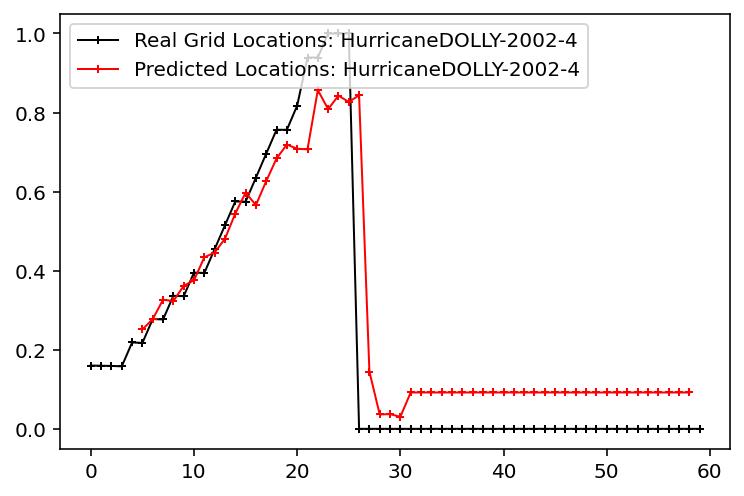

21


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


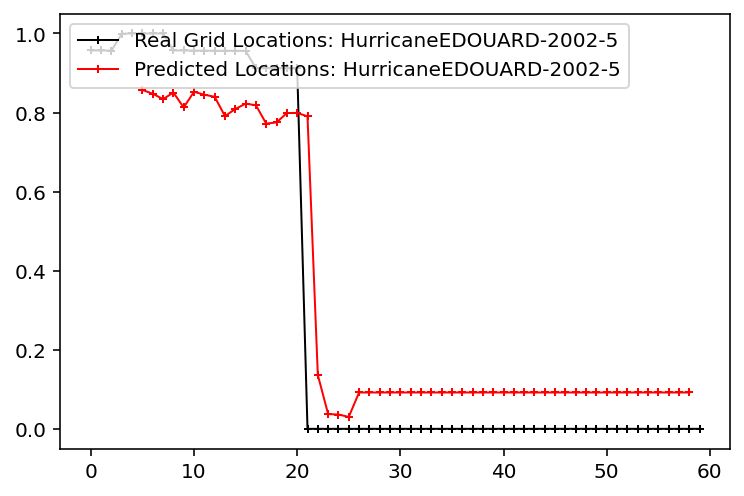

23


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


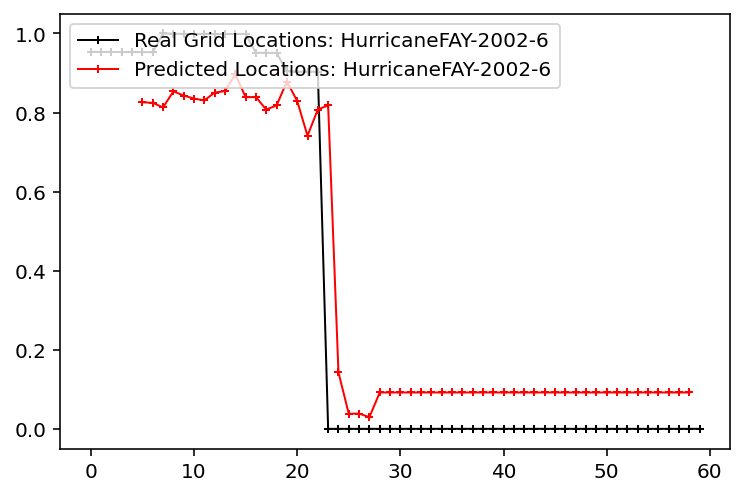

30


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


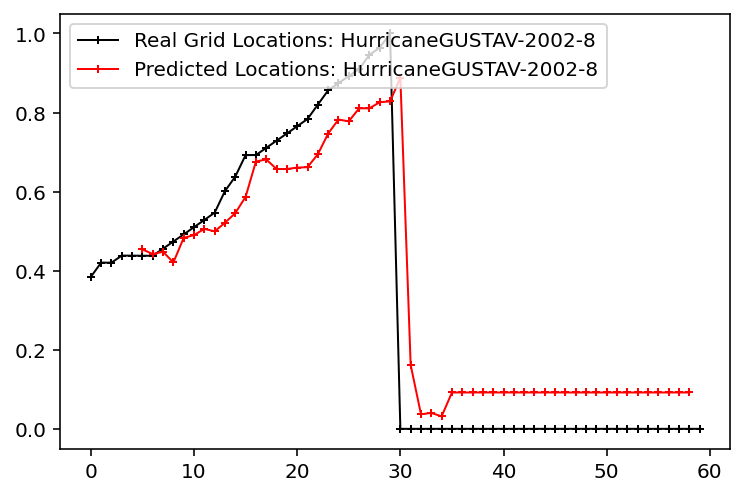

17


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


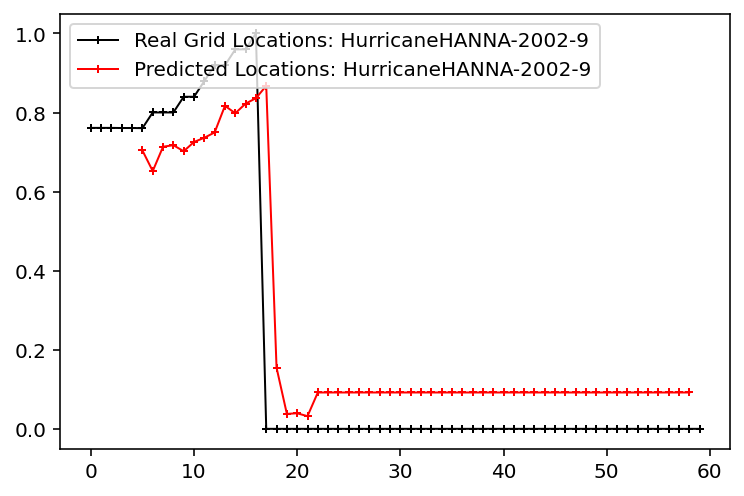

55


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


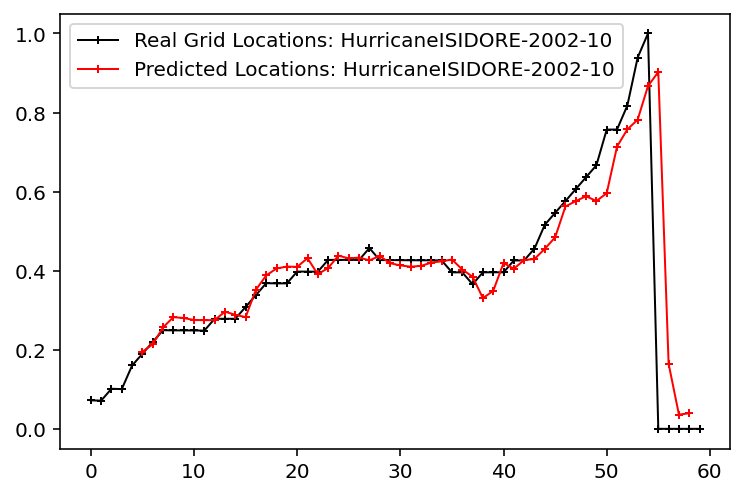

9
57


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


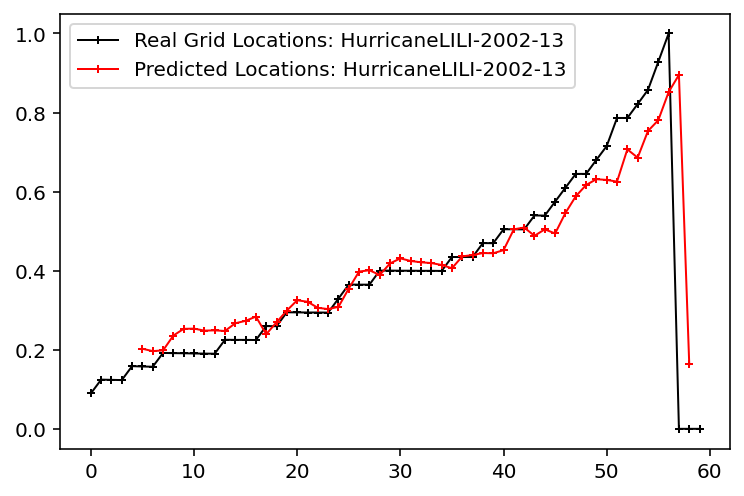

10


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


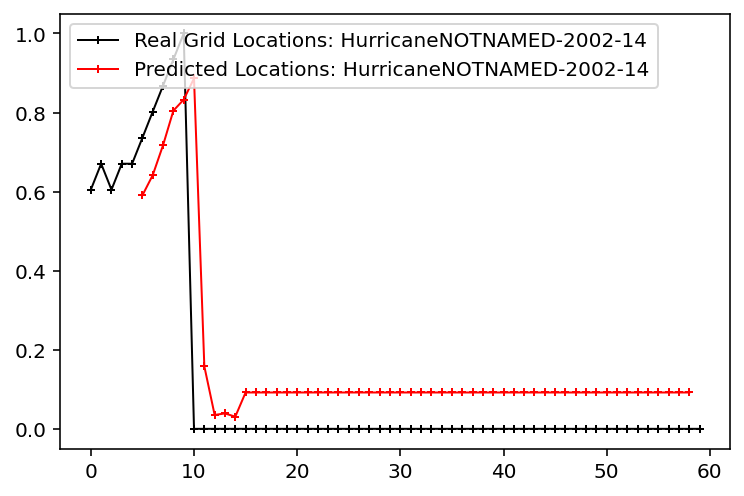

In [192]:
from scipy.signal import savgol_filter
from sklearn.metrics import mean_absolute_error
import math

data = pd.read_csv('checkpoint-dataframe.csv', index_col=0, header=0)

food = ['2002']

names = [v for i, v in enumerate(data['unique-key'].unique()) if any(s in v for s in food)]

for x in names:

    name = x # Hurricane Key

    window = 5
    print (len(data[data['unique-key'] == name]))
    if len(data[data['unique-key'] == name]) < 10:
        continue
    try:
        hurricane = prep_hurricane(data[data['unique-key'] == name], name) # This is good

        hurr_data = load_hurricane(hurricane, window)
    except IndexError:
        continue
    hurricane_temp = hurricane['gridID']
   

    pred = model.predict(hurr_data)
    hurricane_temp = hurricane_temp
    
    y = hurricane_temp
    plt.plot(list(np.arange(0,len(y),1)), y,
             linewidth=1, 
             color='black',
             marker='+',
             markersize=4,
             label='Real Grid Locations: Hurricane' + name)
    plt.plot(list(np.arange(5,len(pred) + 5,1)), pred,
         linewidth=1, 
         color='red',
         marker='+',
         markersize=4,
         label='Predicted Locations: Hurricane' + name)
    plt.legend(loc='upper left')

    plt.savefig('grid_accuracy_one_hurr.png')
    plt.show()

In [194]:
data['unique-key'].unique()

array(['BERYL-2000-5', 'CHRIS-2000-6', 'DEBBY-2000-7', 'ERNESTO-2000-8',
       'FLORENCE-2000-10', 'GORDON-2000-11', 'HELENE-2000-12',
       'ISAAC-2000-13', 'JOYCE-2000-14', 'KEITH-2000-15',
       'LESLIE-2000-16', 'MICHAEL-2000-17', 'NADINE-2000-18',
       'NOTNAMED-2000-19', 'ALLISON-2001-1', 'BARRY-2001-3',
       'CHANTAL-2001-4', 'DEAN-2001-5', 'FELIX-2001-7',
       'GABRIELLE-2001-8', 'HUMBERTO-2001-10', 'IRIS-2001-11',
       'JERRY-2001-12', 'KAREN-2001-13', 'LORNEZO-2001-14',
       'MICHELLE-2001-15', 'NOEL-2001-16', 'OLGA-2001-17',
       'ARTHUR-2002-1', 'BERTHA-2002-2', 'CRISTOBAL-2002-3',
       'DOLLY-2002-4', 'EDOUARD-2002-5', 'FAY-2002-6', 'GUSTAV-2002-8',
       'HANNA-2002-9', 'ISIDORE-2002-10', 'JOSEPHINE-2002-11',
       'LILI-2002-13', 'NOTNAMED-2002-14', 'ANA-2003-1', 'BILL-2003-3',
       'CLAUDETTE-2003-4', 'DANNY-2003-5', 'NOTNAMED-2003-6',
       'NOTNAMED-2003-7', 'ERIKA-2003-8', 'FABIAN-2003-10',
       'GRACE-2003-11', 'HENRI-2003-12', 'ISABEL-2003-1

For Hurricanes in 2005

26


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


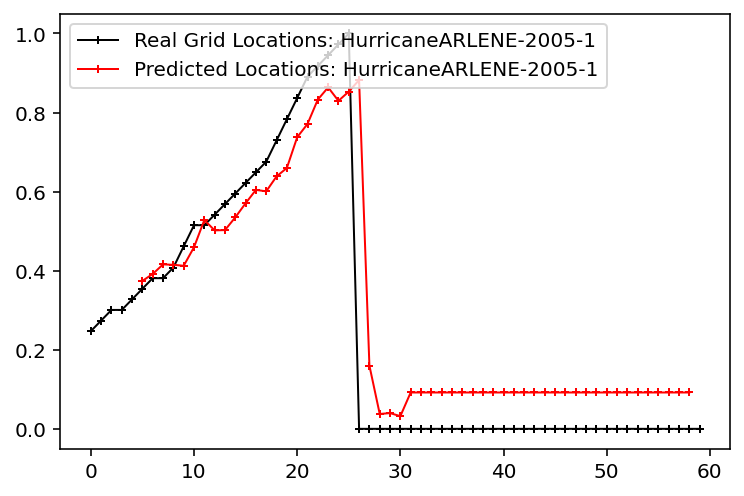

7
33


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


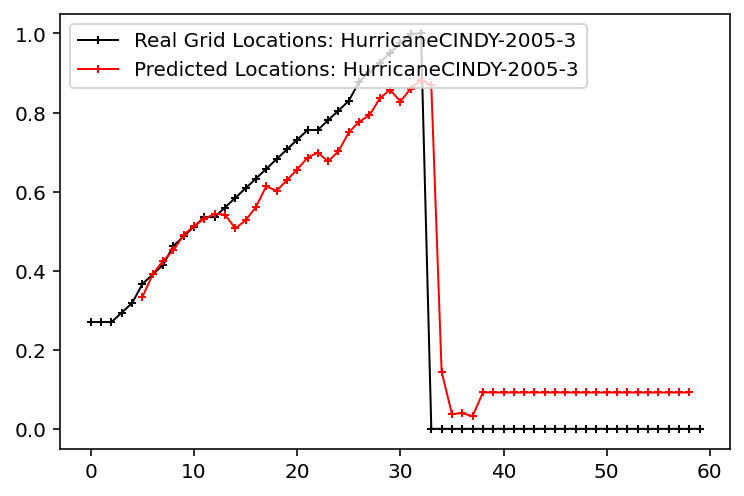

59


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


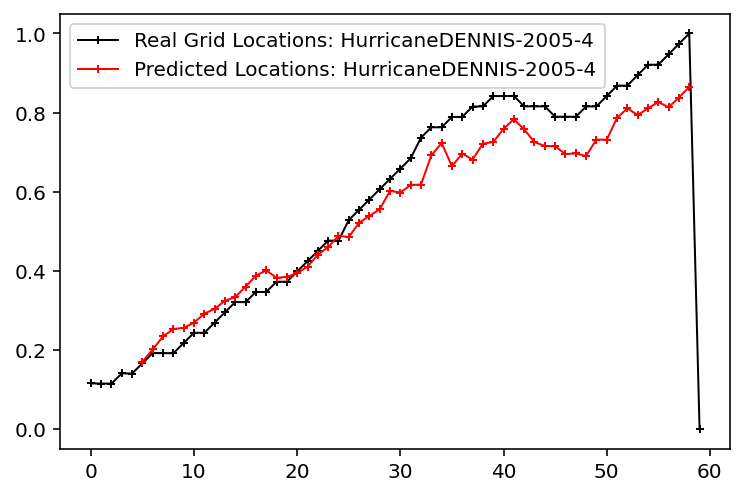

45


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


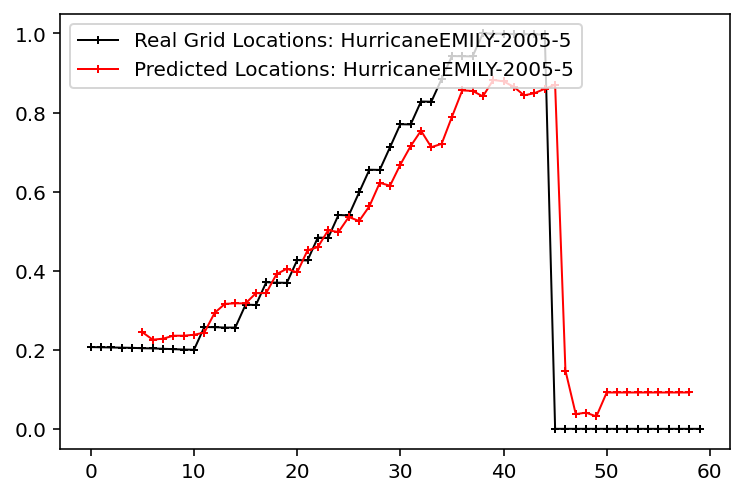

38


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


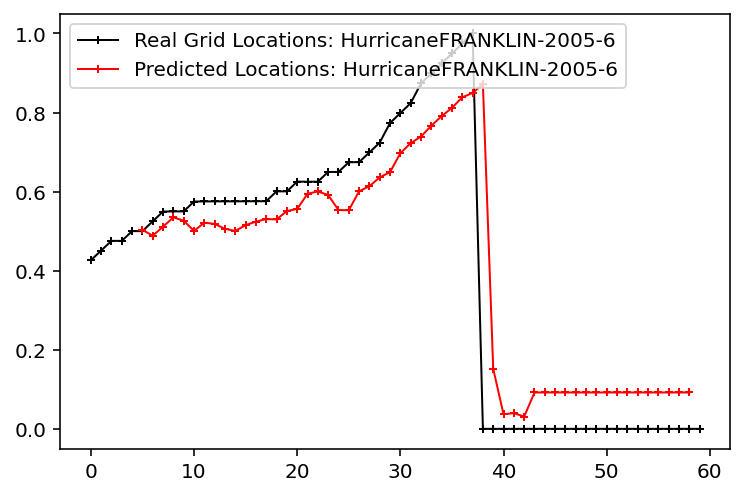

9
46


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


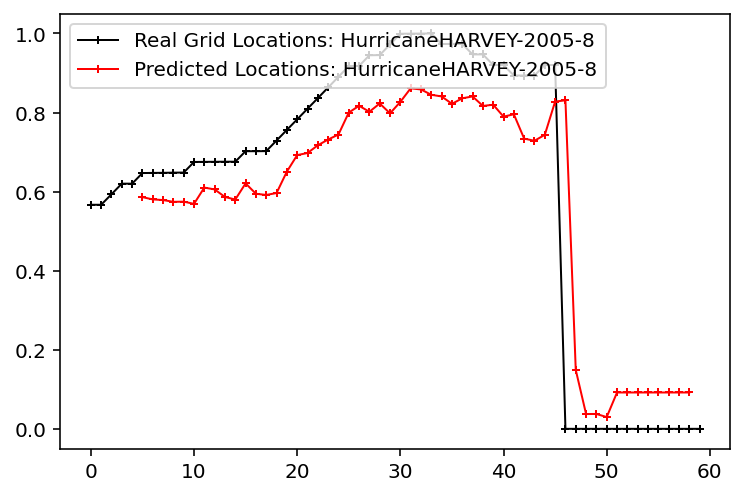

56


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


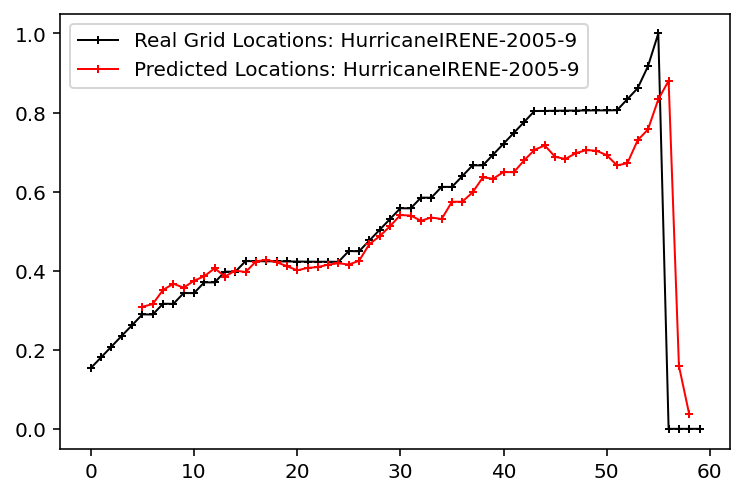

21


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


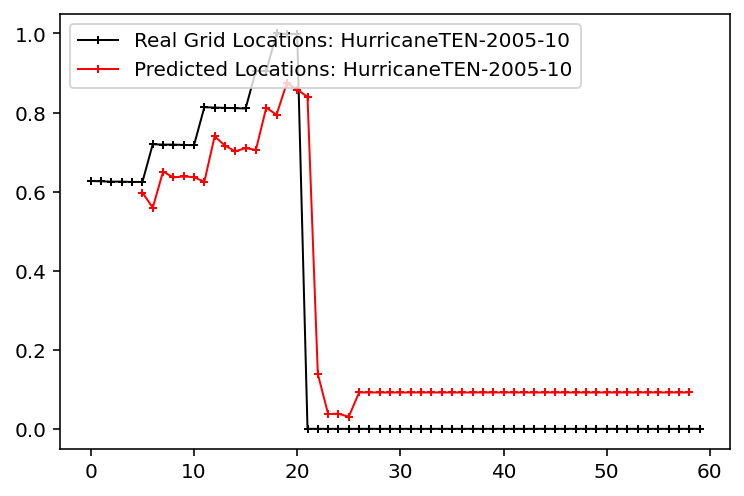

34


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


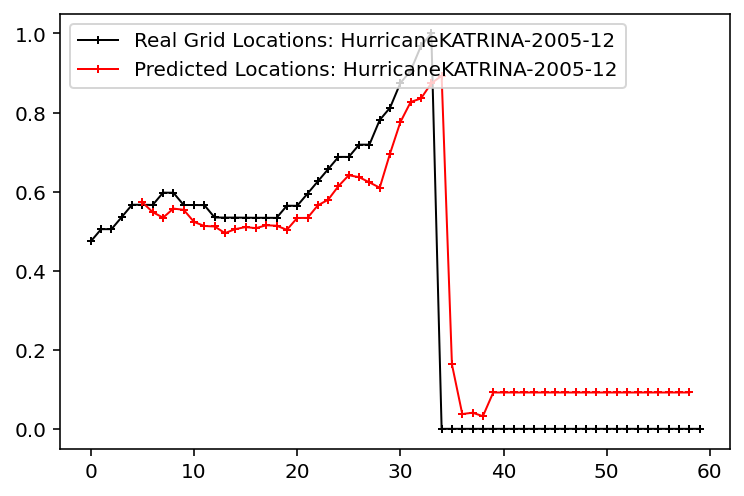

26


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


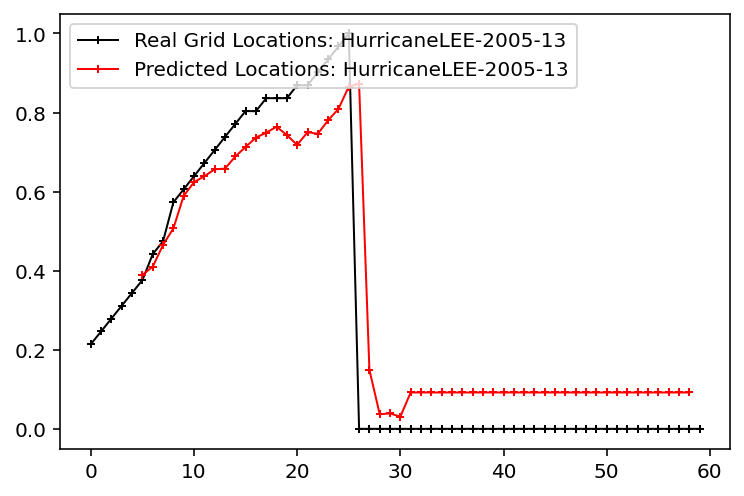

51


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


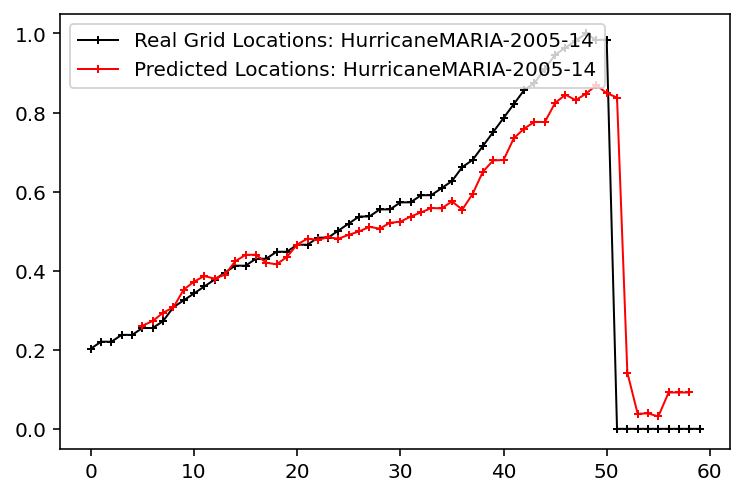

29


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


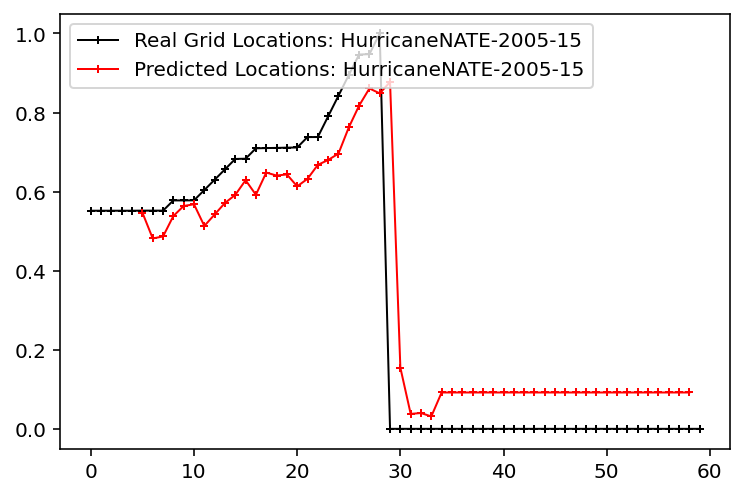

28


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


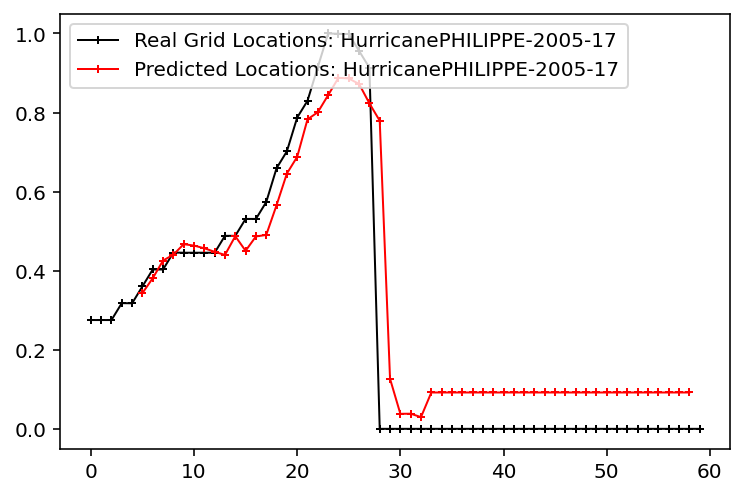

36


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


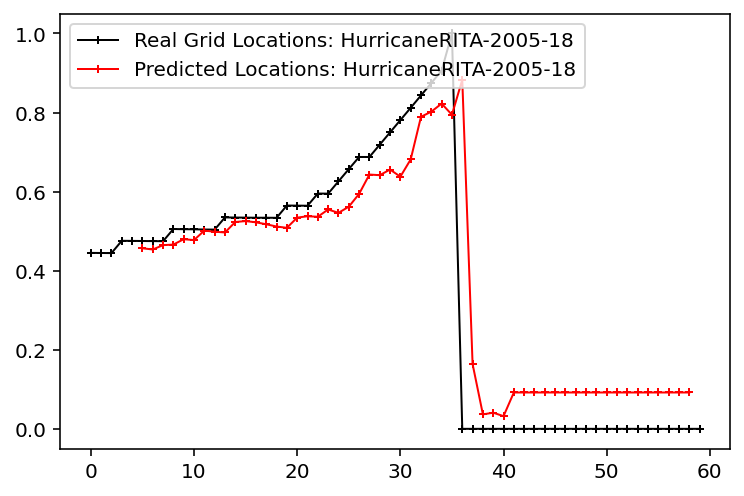

9
17


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


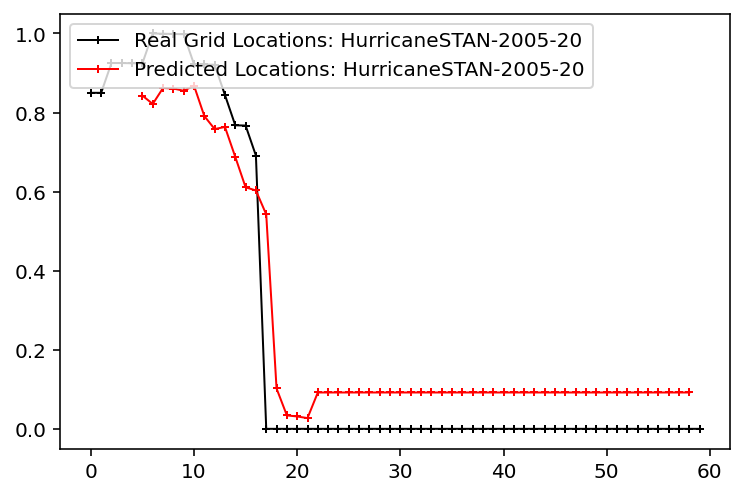

7
9
27


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


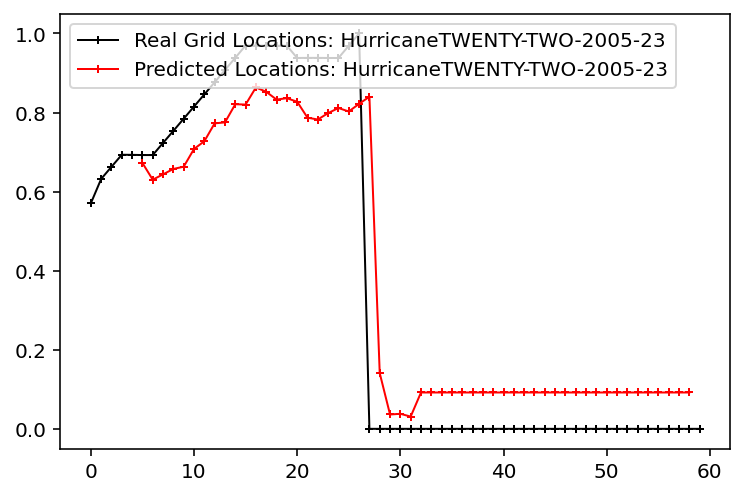

15


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


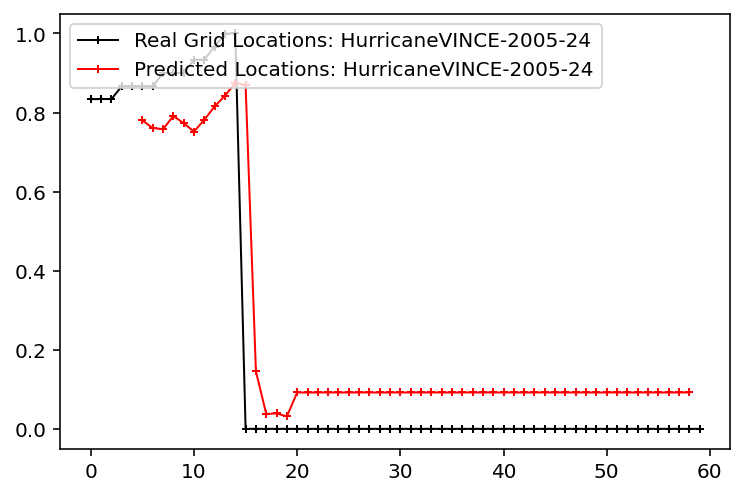

48


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


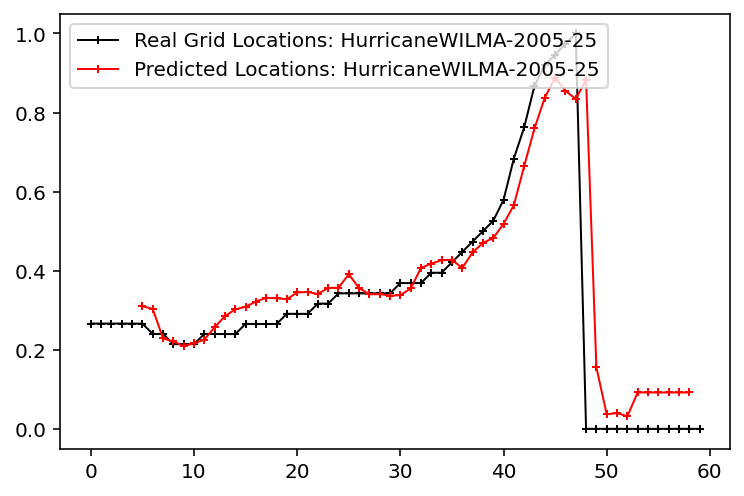

11


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


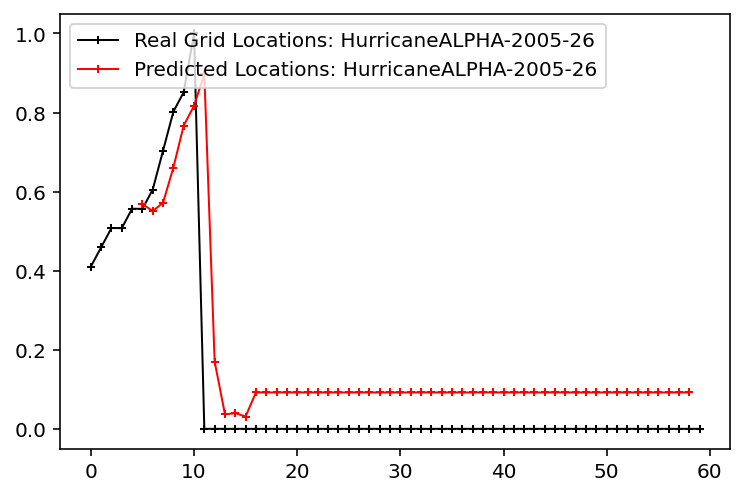

18


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


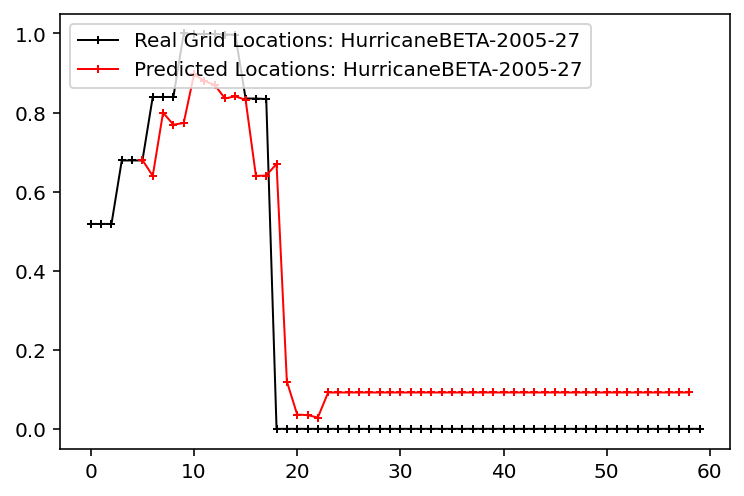

33


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


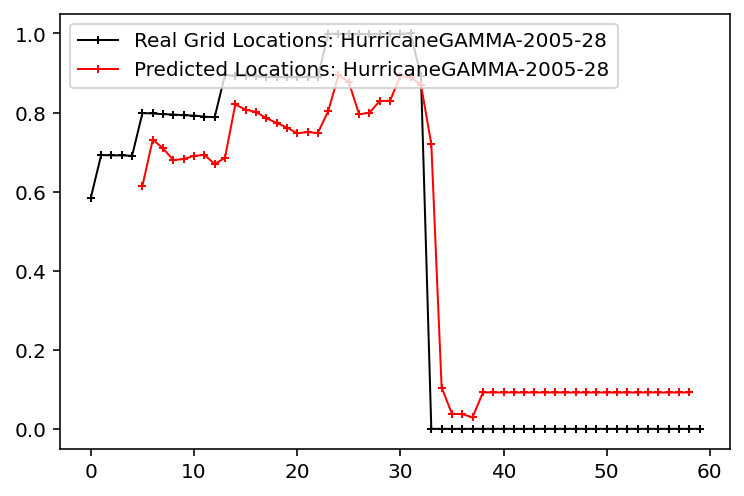

42


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


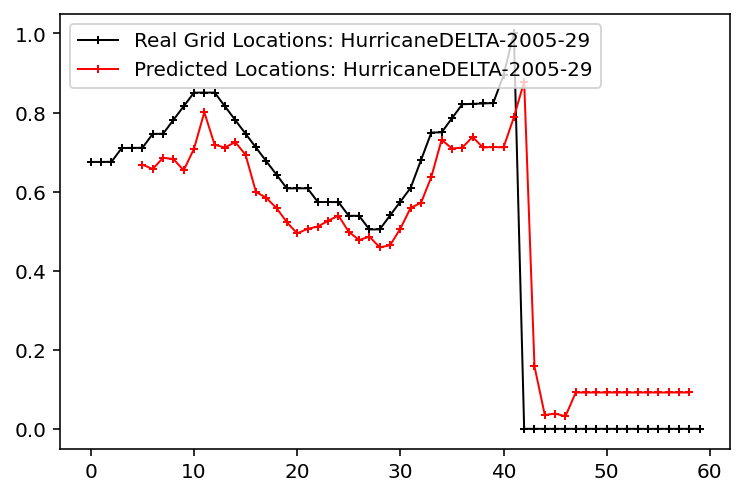

43


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


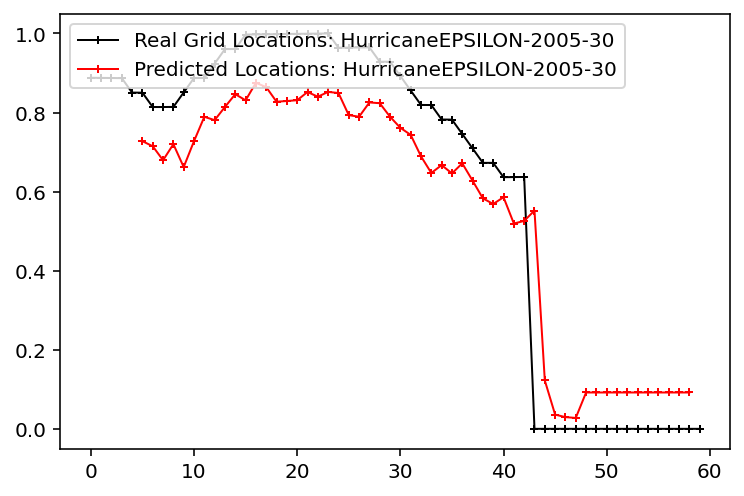

8


In [195]:
food = ['2005']

names = [v for i, v in enumerate(data['unique-key'].unique()) if any(s in v for s in food)]

for x in names:

    name = x # Hurricane Key

    window = 5
    print (len(data[data['unique-key'] == name]))
    if len(data[data['unique-key'] == name]) < 10:
        continue
    try:
        hurricane = prep_hurricane(data[data['unique-key'] == name], name) # This is good

        hurr_data = load_hurricane(hurricane, window)
    except IndexError:
        continue
    hurricane_temp = hurricane['gridID']
   

    pred = model.predict(hurr_data)
    hurricane_temp = hurricane_temp
    
    y = hurricane_temp
    plt.plot(list(np.arange(0,len(y),1)), y,
             linewidth=1, 
             color='black',
             marker='+',
             markersize=4,
             label='Real Grid Locations: Hurricane' + name)
    plt.plot(list(np.arange(5,len(pred) + 5,1)), pred,
         linewidth=1, 
         color='red',
         marker='+',
         markersize=4,
         label='Predicted Locations: Hurricane' + name)
    plt.legend(loc='upper left')

    plt.savefig('grid_accuracy_one_hurr.png')
    plt.show()

Enter year (1950-2018)
2005
Storms in 2005 :
Zeta
Epsilon
Delta
Gamma
Twenty-seven
Beta
Twenty-six
Alpha
Twenty-five
Wilma
Twenty-four
Vince
Twenty-two
Tammy
Stan
Twenty
Nineteen
Rita
Eighteen
Philippe
Seventeen
Ophelia
Sixteen
Nate
Fifteen
Maria
Fourteen
Lee
Thirteen
Katrina
Twelve
Jose
Eleven
Ten
Irene
Nine
Harvey
Eight
Gert
Seven
Franklin
Six
Emily
Five
Dennis
Four
Cindy
Three
Bret
Two
Arlene
One


Enter name:Irene


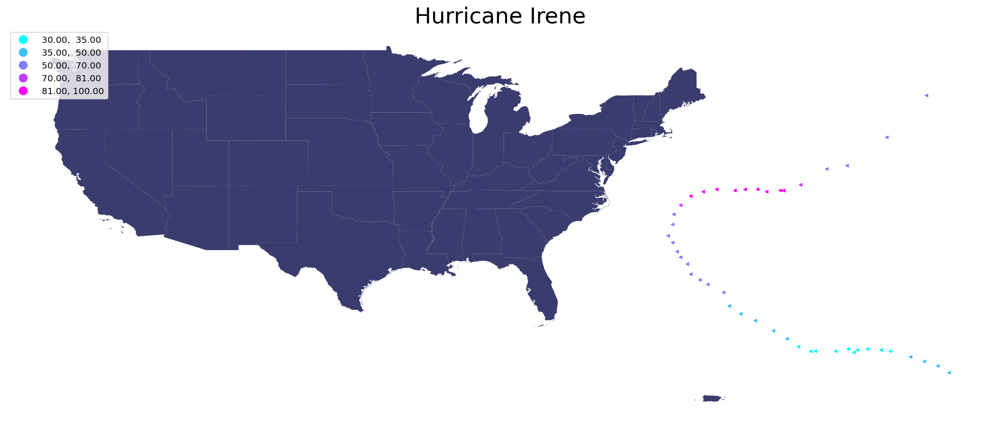

In [196]:
start1(hurricane_list_clean)